### 환경 데이터 EDA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 한글 폰트 사용을 위해서 세팅
from matplotlib import font_manager, rc
font_path = "C:/Windows/Fonts/malgun.ttf"
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)

In [2]:
try :
    import missingno as msno
    
except :
    !pip install missingno
    import missingno as msno

In [3]:
# df = pd.read_csv("2020/1.환경/2020_환경_딸기.csv", encoding="ANSI")
# df = pd.read_csv("2020/1.환경/2020_환경_딸기_1차_농가_선정_누락 시간대 포함.csv", encoding="ANSI")
df = pd.read_csv("2020/1.환경/2020_환경_딸기_1차_농가_선정_시간대 처리 완료.csv", encoding="ANSI")

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101863 entries, 0 to 101862
Data columns (total 17 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   realTime  101863 non-null  object 
 1   농가명       101863 non-null  int64  
 2   도         101790 non-null  object 
 3   시군        101790 non-null  object 
 4   품목        101790 non-null  object 
 5   작기        101790 non-null  float64
 6   측정시간      97952 non-null   object 
 7   온도_외부     97814 non-null   float64
 8   풍향_외부     39193 non-null   float64
 9   풍속_외부     84862 non-null   float64
 10  일사량_외부    84540 non-null   float64
 11  누적일사량_외부  63694 non-null   float64
 12  강우감지      97485 non-null   float64
 13  온도_내부     96914 non-null   float64
 14  상대습도_내부   95451 non-null   float64
 15  잔존CO2     93741 non-null   float64
 16  토양온도      92594 non-null   float64
dtypes: float64(11), int64(1), object(5)
memory usage: 13.2+ MB


In [4]:
farms = df["농가명"].unique()
farms

array([ 2,  4,  5, 11, 16, 17, 20, 23, 24, 25, 26, 31, 34, 38, 49, 52, 51],
      dtype=int64)

In [5]:
num_cols = ['온도_외부', '온도_내부', '상대습도_내부', '잔존CO2', '토양온도']
num_cols

['온도_외부', '온도_내부', '상대습도_내부', '잔존CO2', '토양온도']

결측치 시각화

In [ ]:
# seaborn
%matplotlib inline
for f in farms :
    sub_df = df[df["농가명"] == f][num_cols]
    sns.heatmap(sub_df.isnull(), cbar=False)
    plt.xticks(rotation=45)
    
    plt.title(f)

    # 여백 조절
    plt.subplots_adjust(top=0.9, bottom=0.3, left=0.1, right=0.9)

    plt.savefig(f"2020/1.환경/plot/seaborn_null_{f}.png")
    plt.show()
    

In [11]:
# missingno
for f in farms :
    sub_df = df[df["농가명"] == f][num_cols]

     # 빈 matplotlib 그림 생성
    fig, ax = plt.subplots(figsize=(30, 15), facecolor='lightgray')
    
    # msno.matrix 그림 그리기
    msno.matrix(sub_df, ax=ax)
    # plt.figure(facecolor='lightgray')

    # msno.matrix(sub_df)

    plt.xticks(rotation=45)
    plt.title(f, fontsize=20)

    # 여백 조절
    plt.subplots_adjust(top=0.8, bottom=0.05, left=0.05, right=0.9)

    plt.savefig(f"2020/1.환경/plot/msno_null_final_{f}.png")
    # plt.show()
    plt.close()  # 그림 닫기


c:\Users\mool8\anaconda3\lib\site-packages\missingno\missingno.py:61: UserWarning: Plotting a sparkline on an existing axis is not currently supported. To remove this warning, set sparkline=False.
  warnings.warn(
c:\Users\mool8\anaconda3\lib\site-packages\missingno\missingno.py:61: UserWarning: Plotting a sparkline on an existing axis is not currently supported. To remove this warning, set sparkline=False.
  warnings.warn(
c:\Users\mool8\anaconda3\lib\site-packages\missingno\missingno.py:61: UserWarning: Plotting a sparkline on an existing axis is not currently supported. To remove this warning, set sparkline=False.
  warnings.warn(
c:\Users\mool8\anaconda3\lib\site-packages\missingno\missingno.py:61: UserWarning: Plotting a sparkline on an existing axis is not currently supported. To remove this warning, set sparkline=False.
  warnings.warn(
c:\Users\mool8\anaconda3\lib\site-packages\missingno\missingno.py:61: UserWarning: Plotting a sparkline on an existing axis is not currently sup

In [13]:
sub_df.shape

(8559, 10)

결측치 비율 추출

In [12]:
num_cols = ['온도_외부', '온도_내부', '상대습도_내부', '잔존CO2', '토양온도']
num_cols

['온도_외부', '온도_내부', '상대습도_내부', '잔존CO2', '토양온도']

In [16]:
d = {"농가명":[], "온도_외부":[], "온도_내부":[], "상대습도_내부":[], "잔존CO2":[],"토양온도":[]}

for f in farms :
    sub_df = df[df["농가명"] == f][num_cols]
    # print(f"===== {f}번 농가 결측치 비율 =====")
    d["농가명"].append(f)
    for i in num_cols :
        d[i].append(sub_df[i].isna().sum() / sub_df.shape[0] * 100)
        # print(f"{i} : {sub_df[i].isna().sum() / sub_df.shape[0] * 100:.2f}%")
    # print()

dd = pd.DataFrame.from_dict(data=d, orient='columns')
dd.to_csv("2020/1.환경/2020_환경_딸기_1차_농가_선정_결측치.csv", encoding="ANSI")

In [13]:
for f in farms :
    sub_df = df[df["농가명"] == f][num_cols]
    print(f"===== {f}번 농가 결측치 비율 =====")
    for i in num_cols :
        print(f"{i} : {sub_df[i].isna().sum() / sub_df.shape[0] * 100:.2f}%")
    print()

===== 2번 농가 결측치 비율 =====
온도_외부 : 0.76%
온도_내부 : 0.76%
상대습도_내부 : 0.78%
잔존CO2 : 12.44%
토양온도 : 0.76%

===== 4번 농가 결측치 비율 =====
온도_외부 : 4.44%
온도_내부 : 0.34%
상대습도_내부 : 0.34%
잔존CO2 : 11.43%
토양온도 : 0.34%

===== 5번 농가 결측치 비율 =====
온도_외부 : 0.00%
온도_내부 : 0.00%
상대습도_내부 : 0.00%
잔존CO2 : 2.97%
토양온도 : 0.00%

===== 11번 농가 결측치 비율 =====
온도_외부 : 1.45%
온도_내부 : 9.43%
상대습도_내부 : 0.02%
잔존CO2 : 18.75%
토양온도 : 24.81%

===== 16번 농가 결측치 비율 =====
온도_외부 : 13.01%
온도_내부 : 13.01%
상대습도_내부 : 13.01%
잔존CO2 : 18.85%
토양온도 : 13.01%

===== 17번 농가 결측치 비율 =====
온도_외부 : 0.18%
온도_내부 : 0.18%
상대습도_내부 : 0.18%
잔존CO2 : 1.52%
토양온도 : 0.18%

===== 20번 농가 결측치 비율 =====
온도_외부 : 0.05%
온도_내부 : 0.05%
상대습도_내부 : 0.05%
잔존CO2 : 0.07%
토양온도 : 0.05%

===== 23번 농가 결측치 비율 =====
온도_외부 : 19.80%
온도_내부 : 19.80%
상대습도_내부 : 19.80%
잔존CO2 : 19.83%
토양온도 : 19.83%

===== 24번 농가 결측치 비율 =====
온도_외부 : 4.54%
온도_내부 : 4.56%
상대습도_내부 : 22.31%
잔존CO2 : 4.58%
토양온도 : 4.54%

===== 25번 농가 결측치 비율 =====
온도_외부 : 25.65%
온도_내부 : 25.71%
상대습도_내부 : 25.65%
잔존CO2 : 25.65%
토양온도 : 25.65%

===

변수 추이 시각화

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


51


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


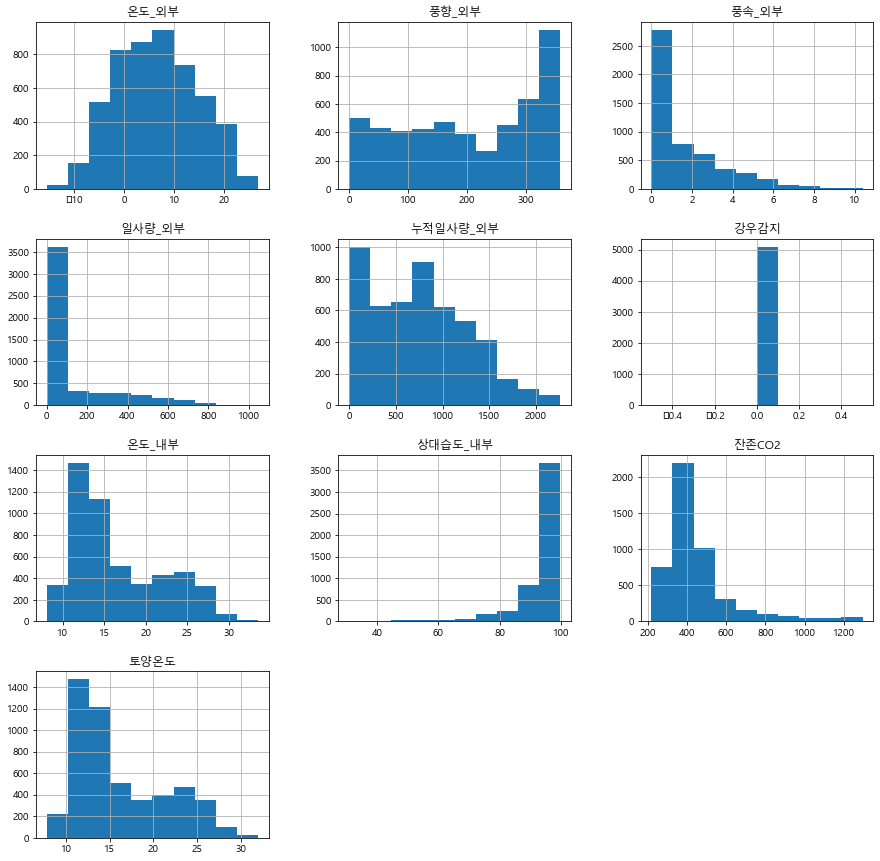

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


52


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


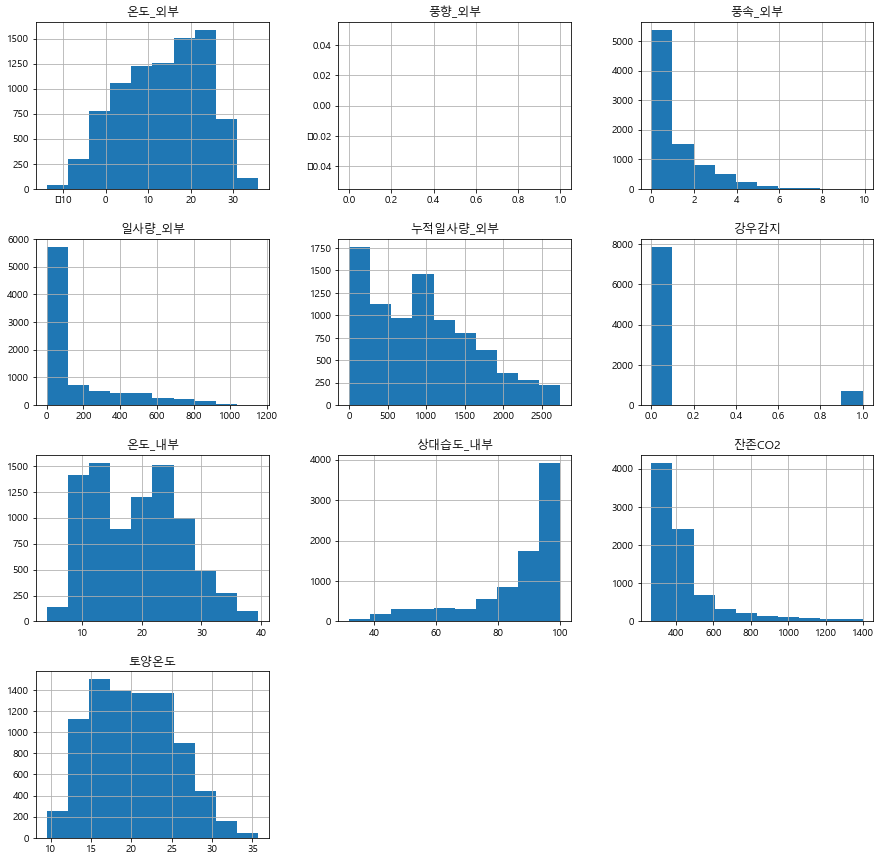

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


53


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


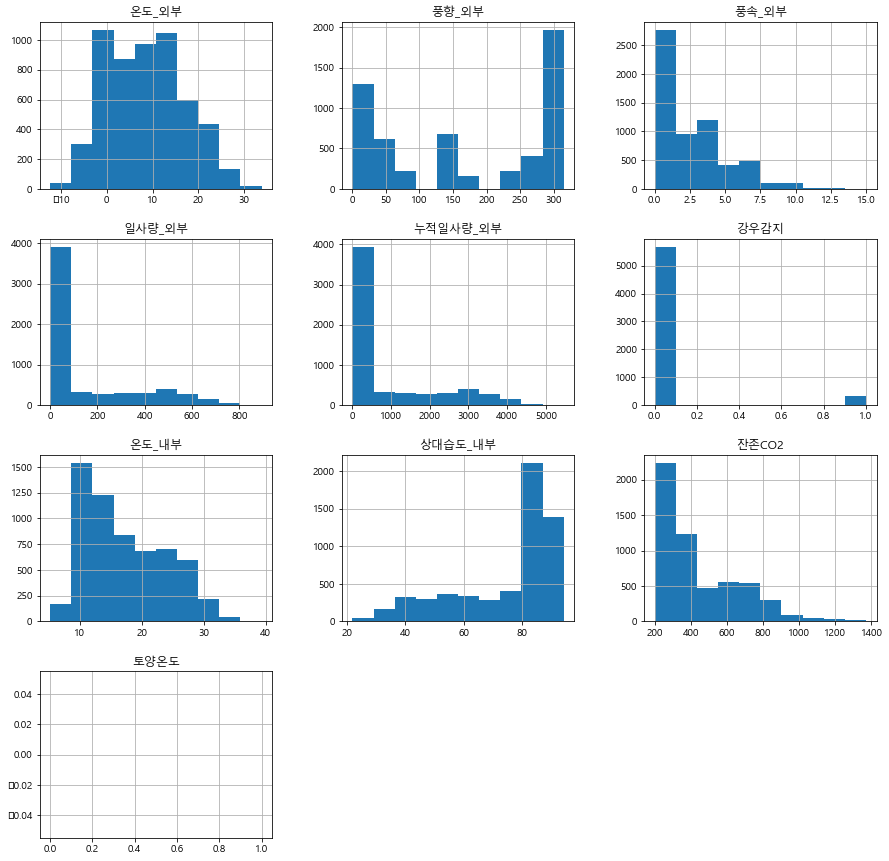

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


49


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


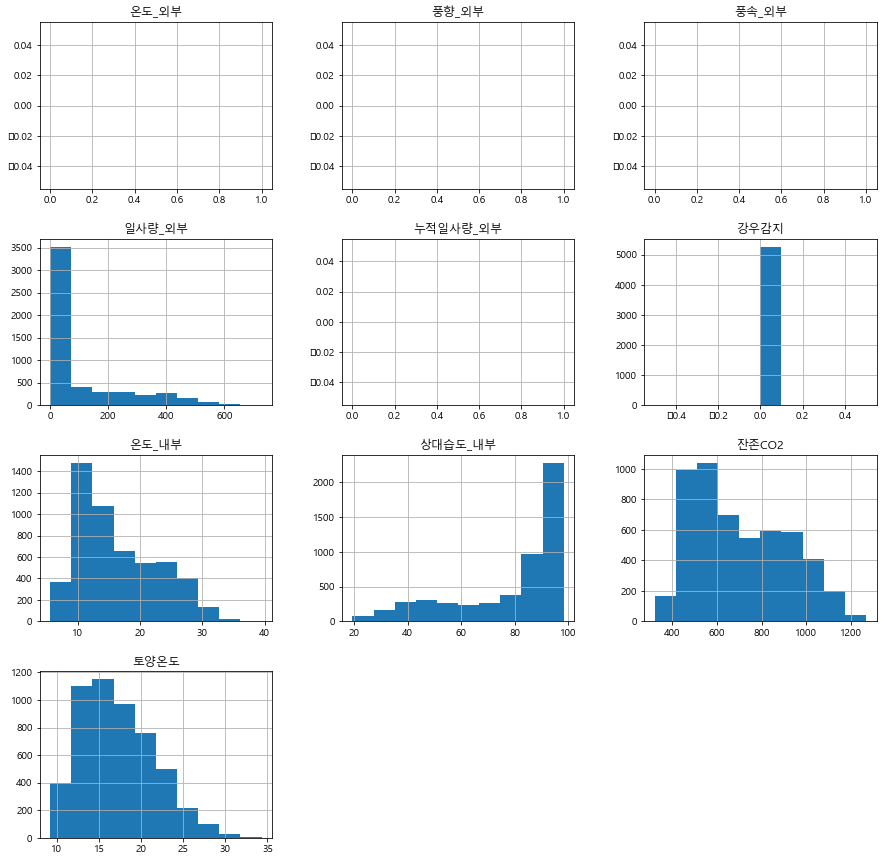

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


50


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


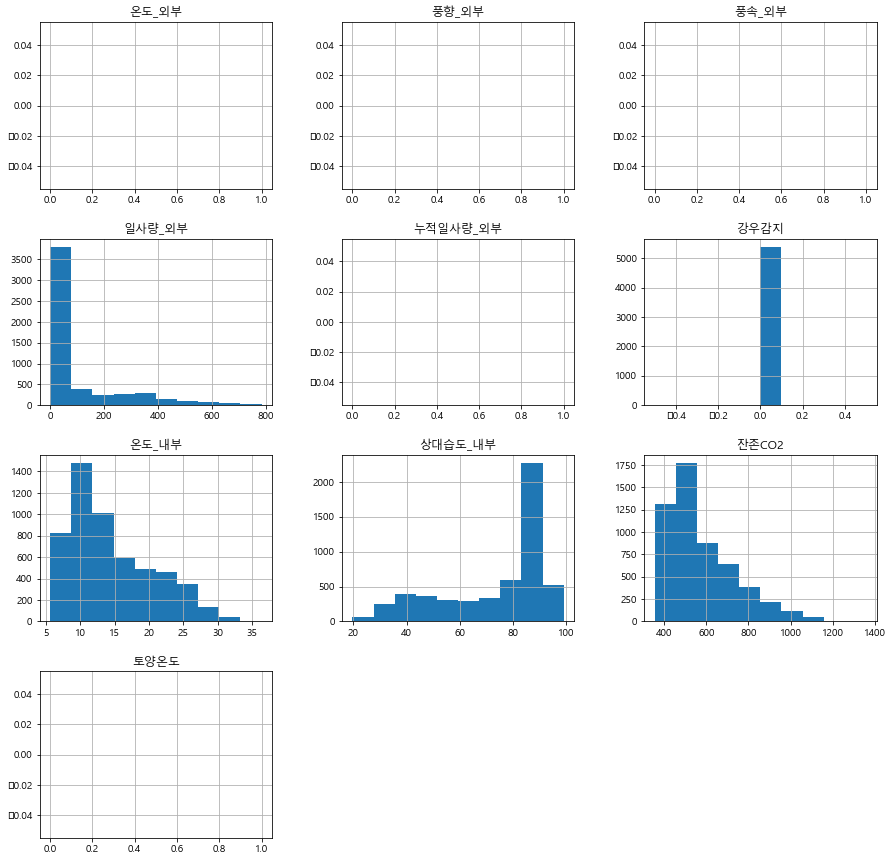

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


38


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


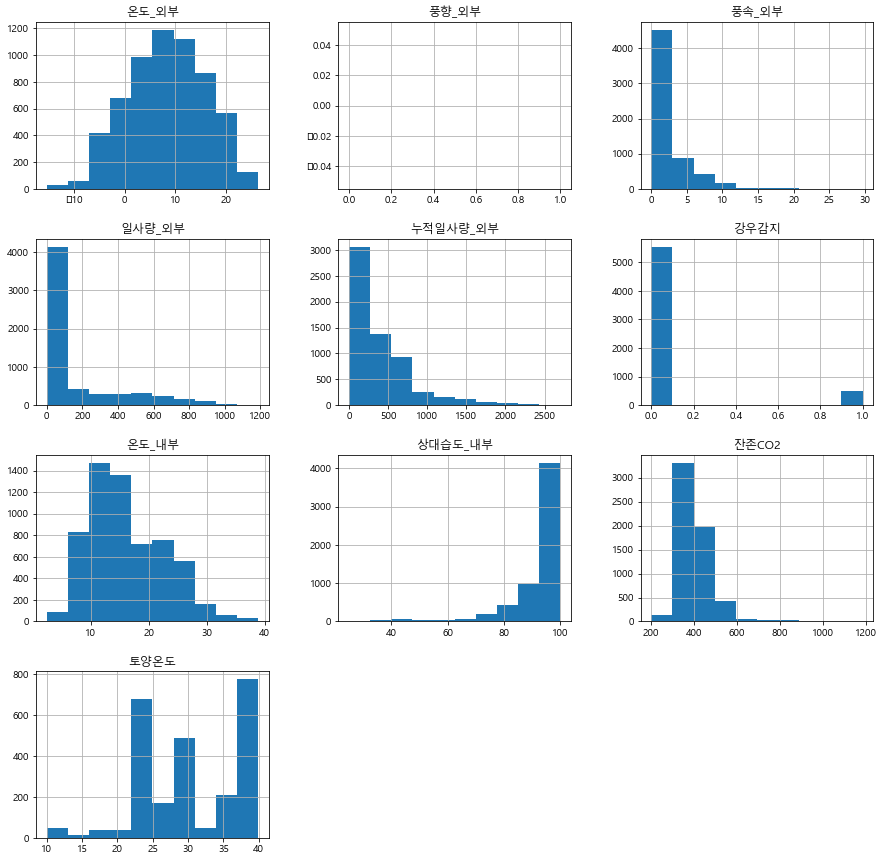

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


40


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


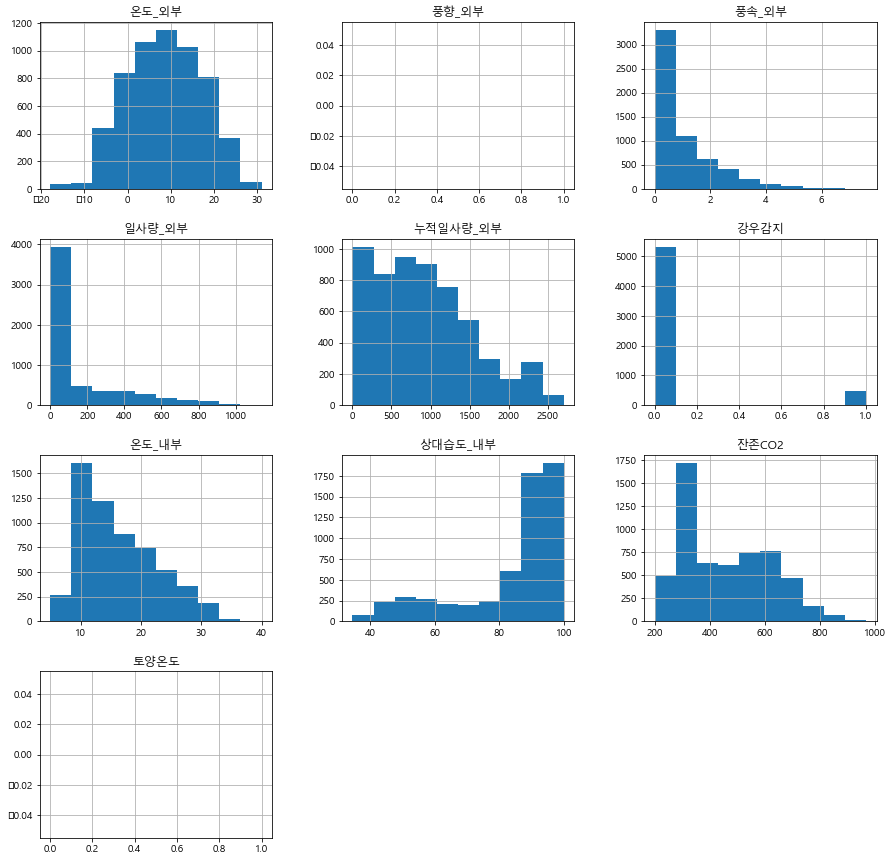

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


48


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


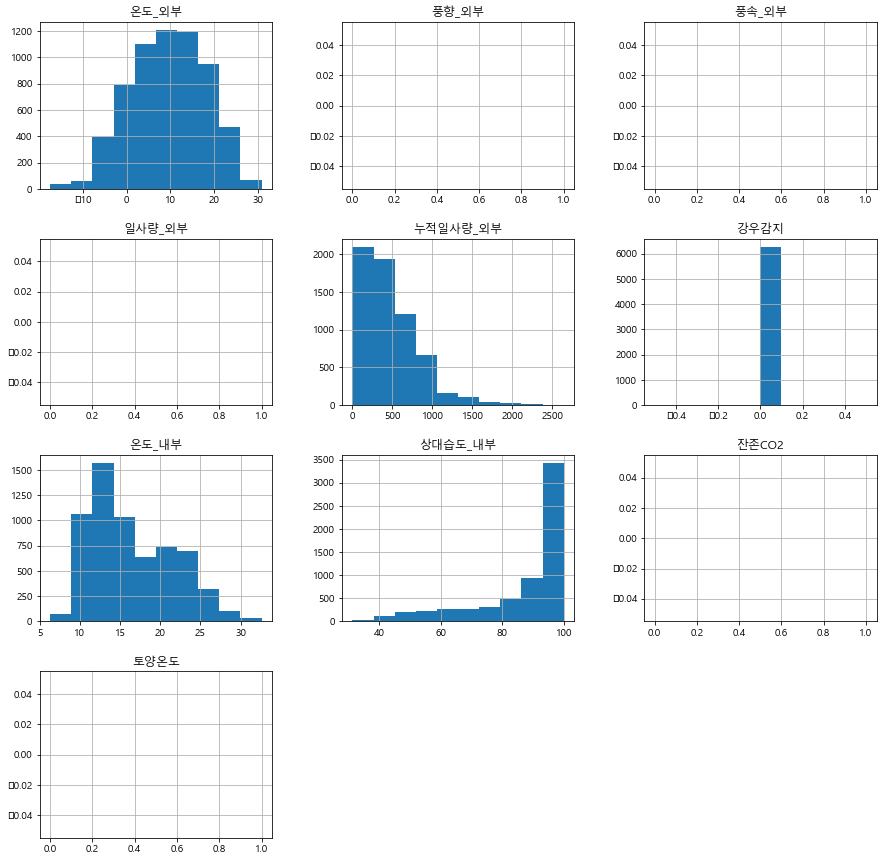

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


29


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


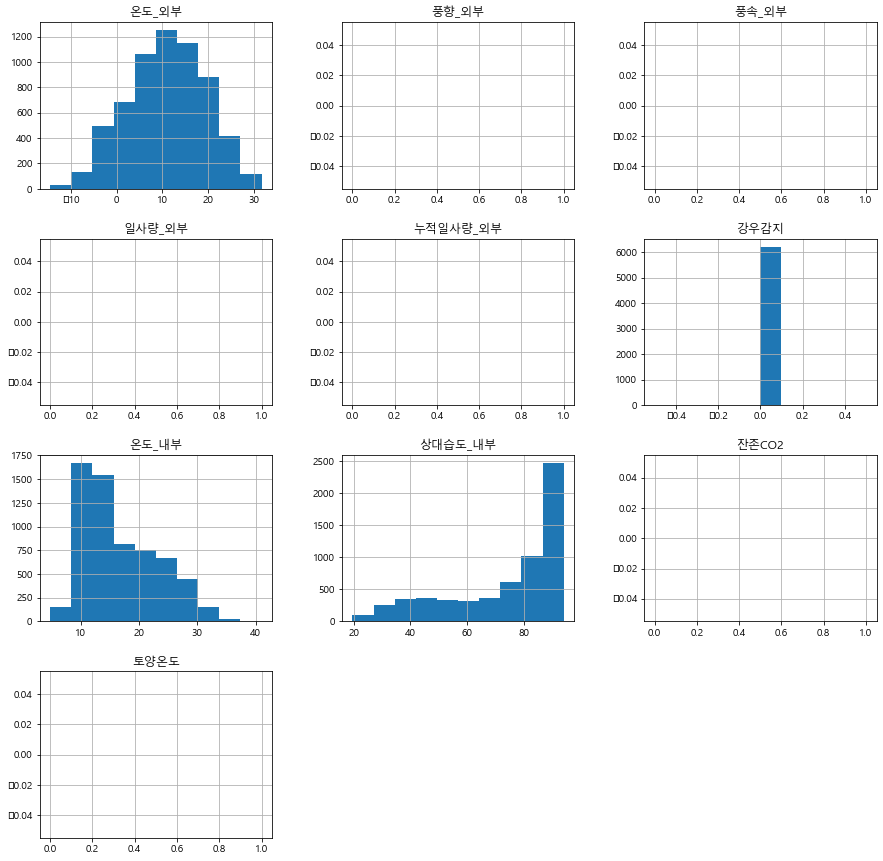

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


33


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


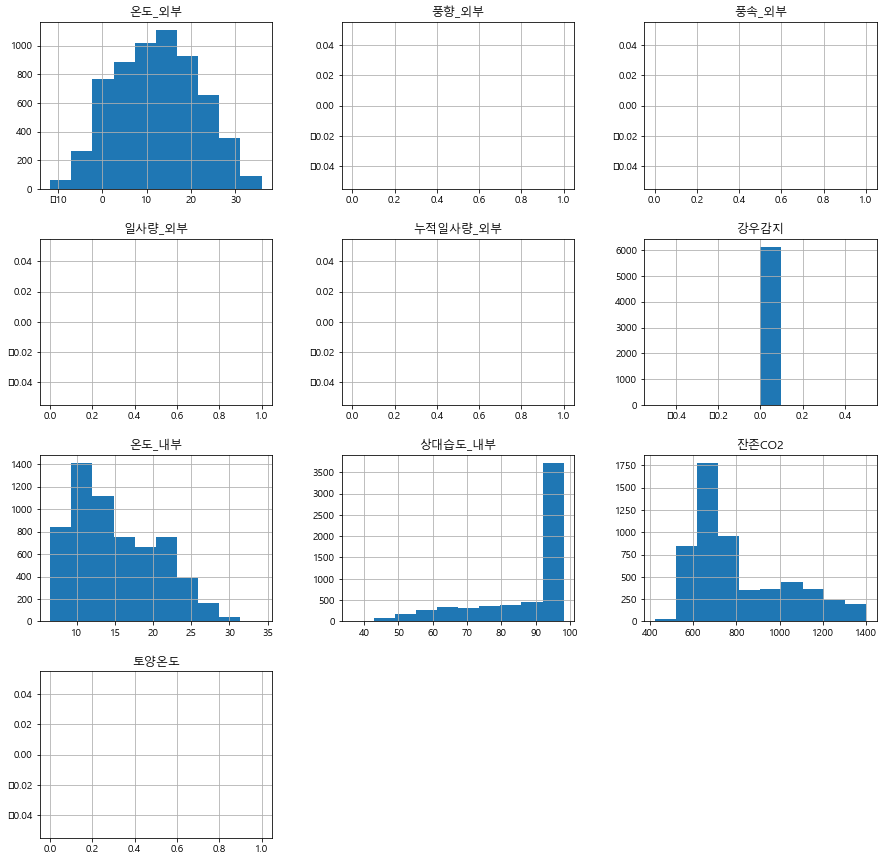

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


46


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


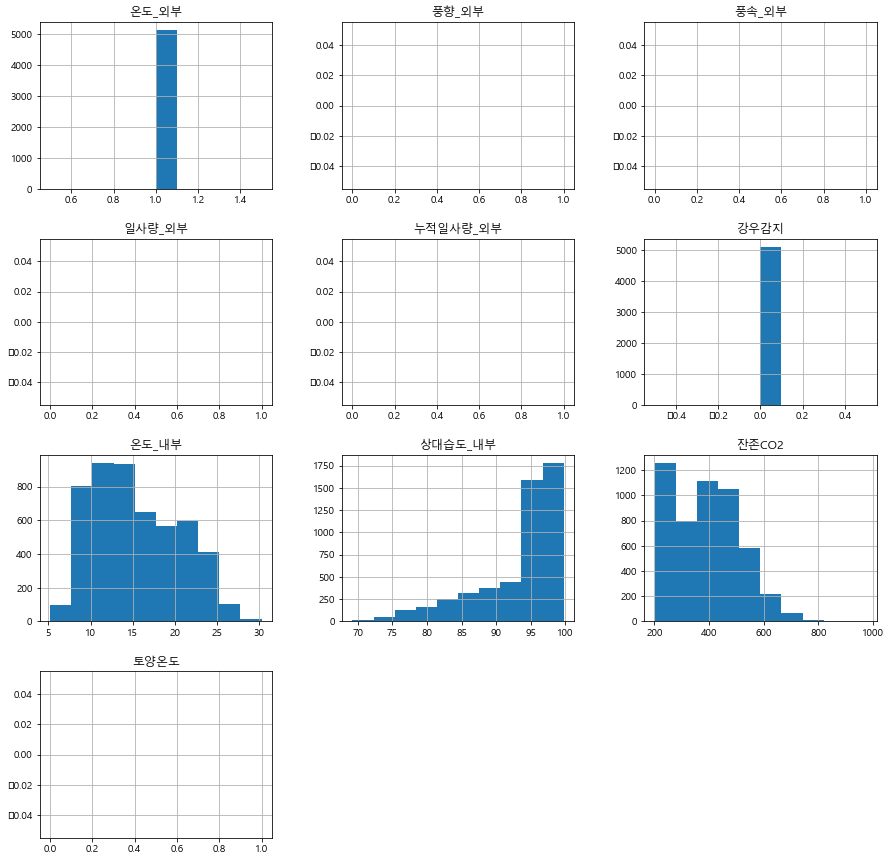

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


30


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


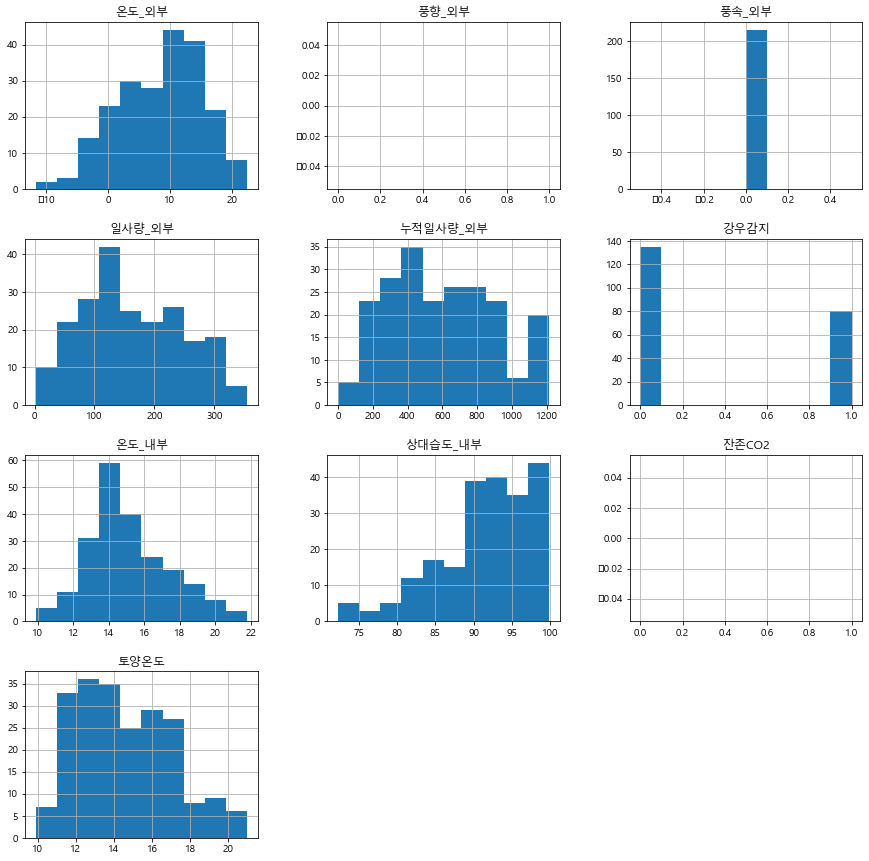

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


36


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


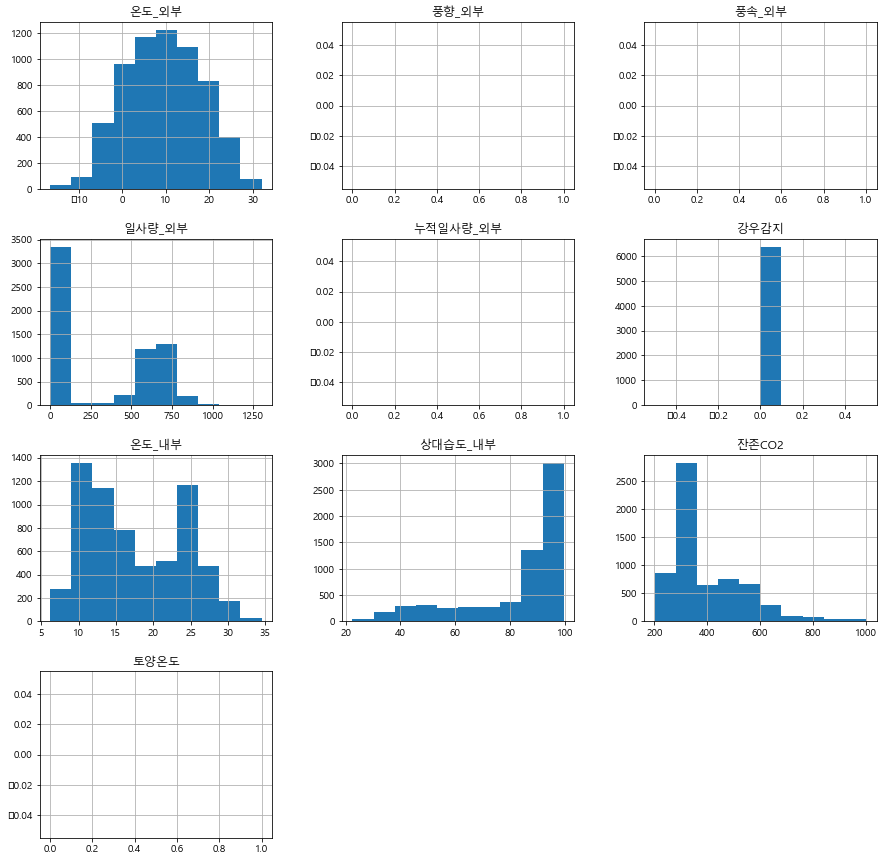

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


42


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


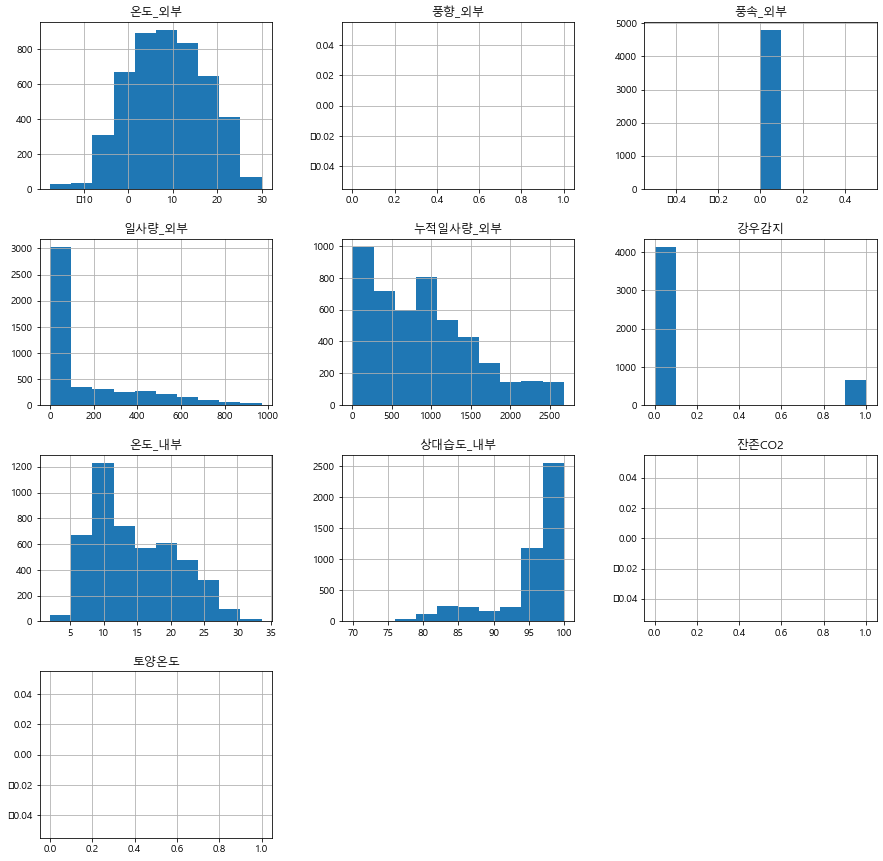

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


45


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


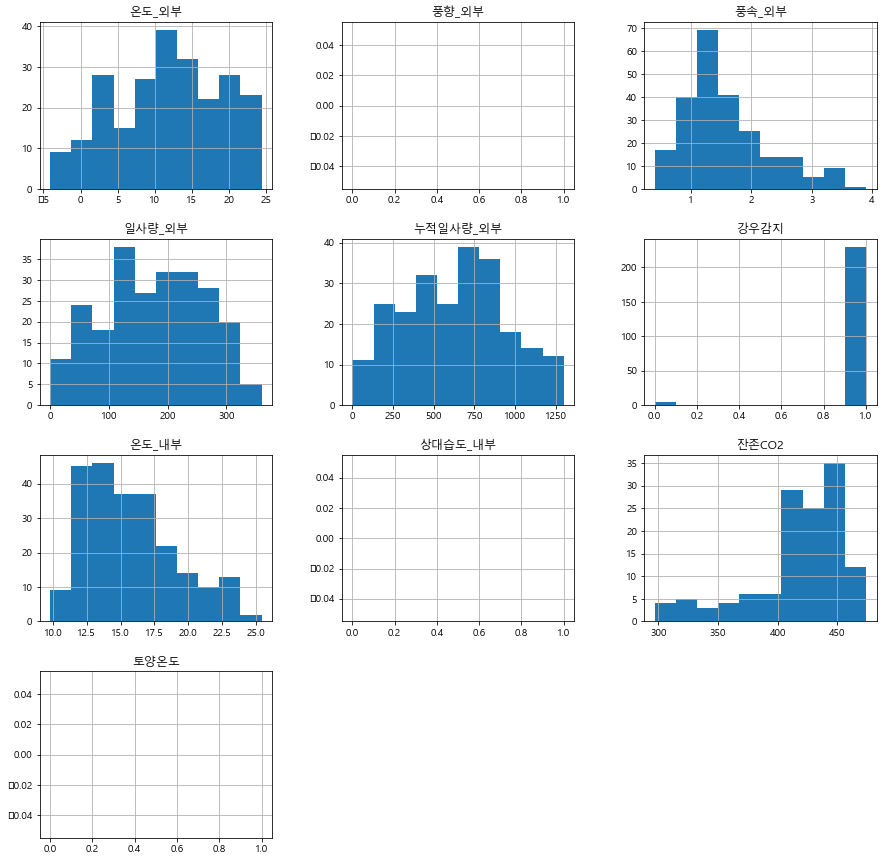

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


31


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


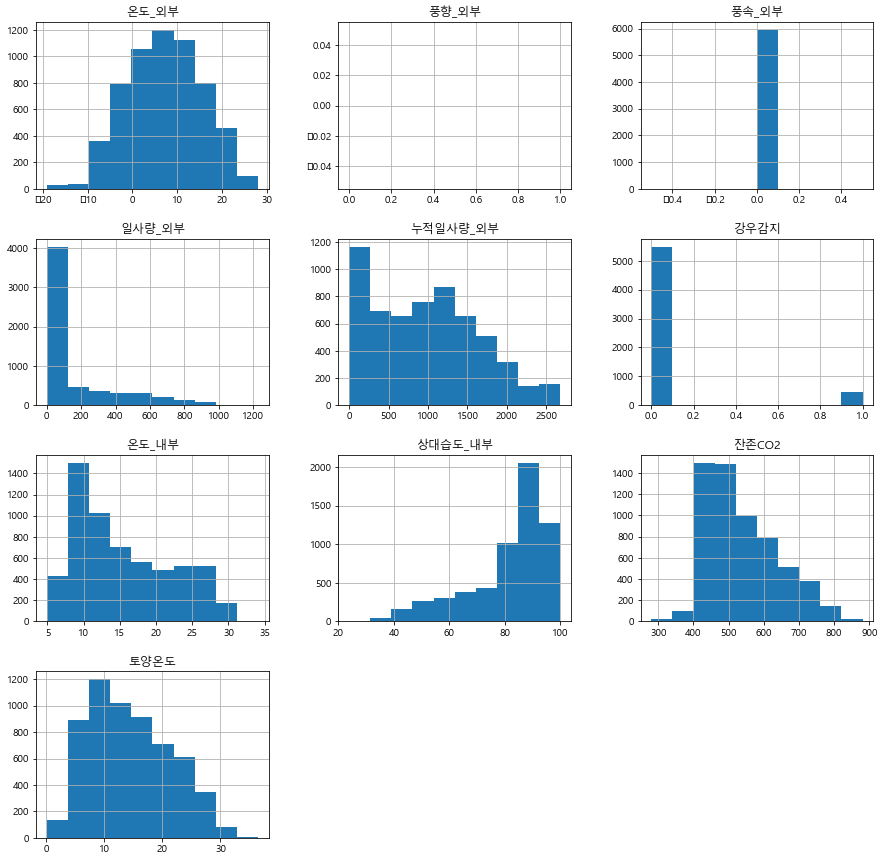

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


34


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


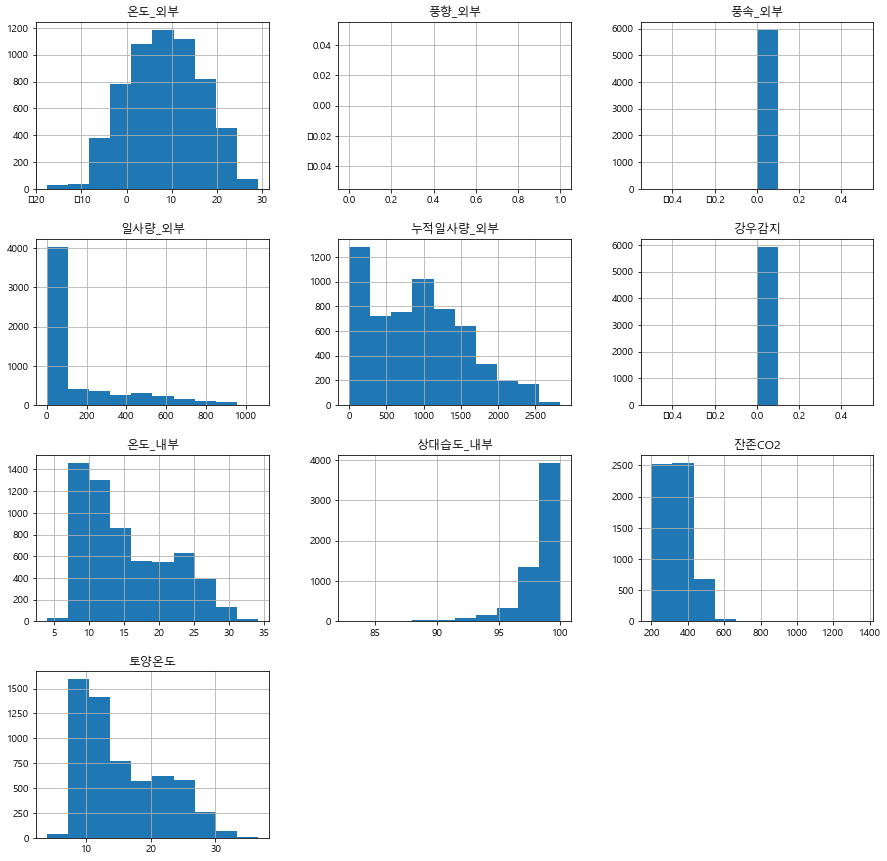

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


35


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


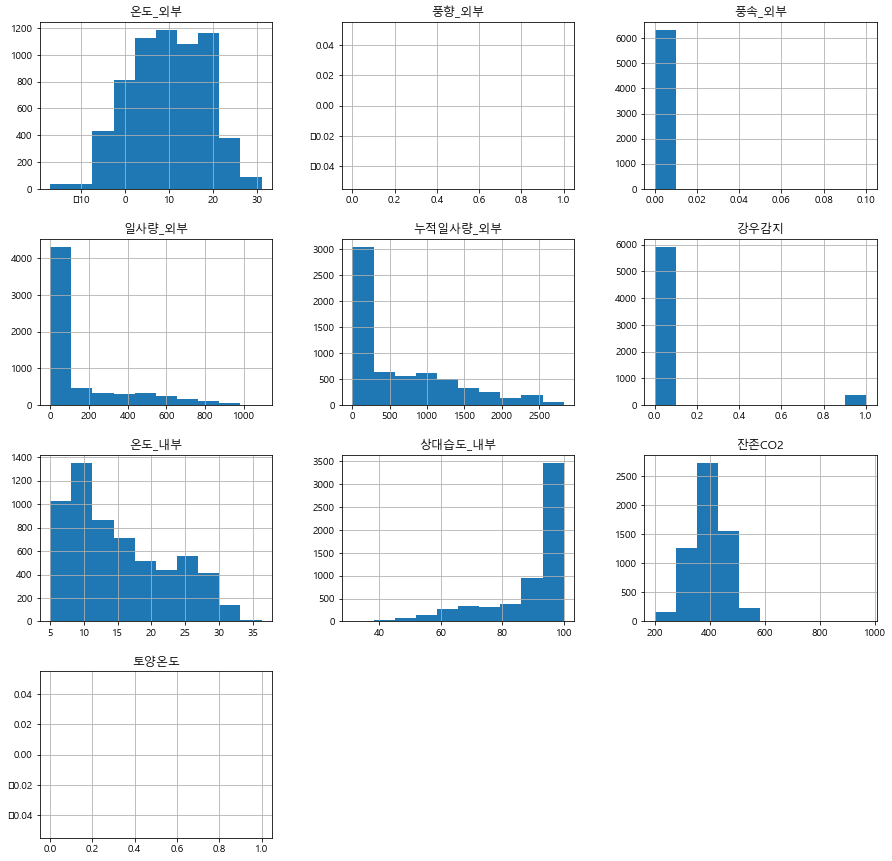

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


37


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


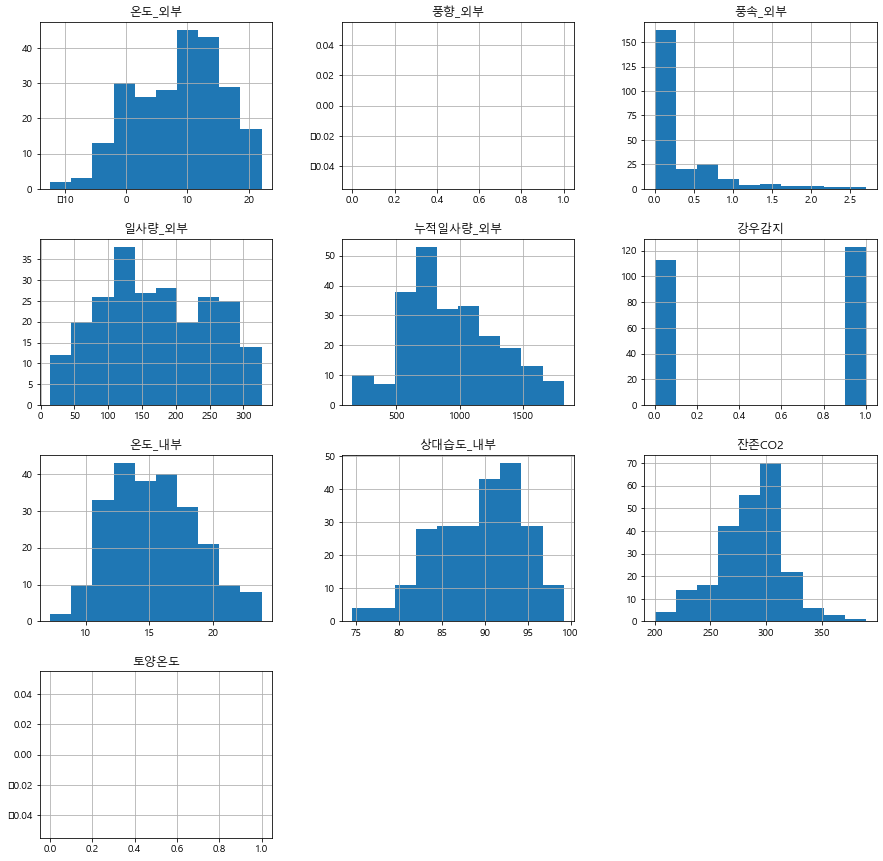

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


39


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


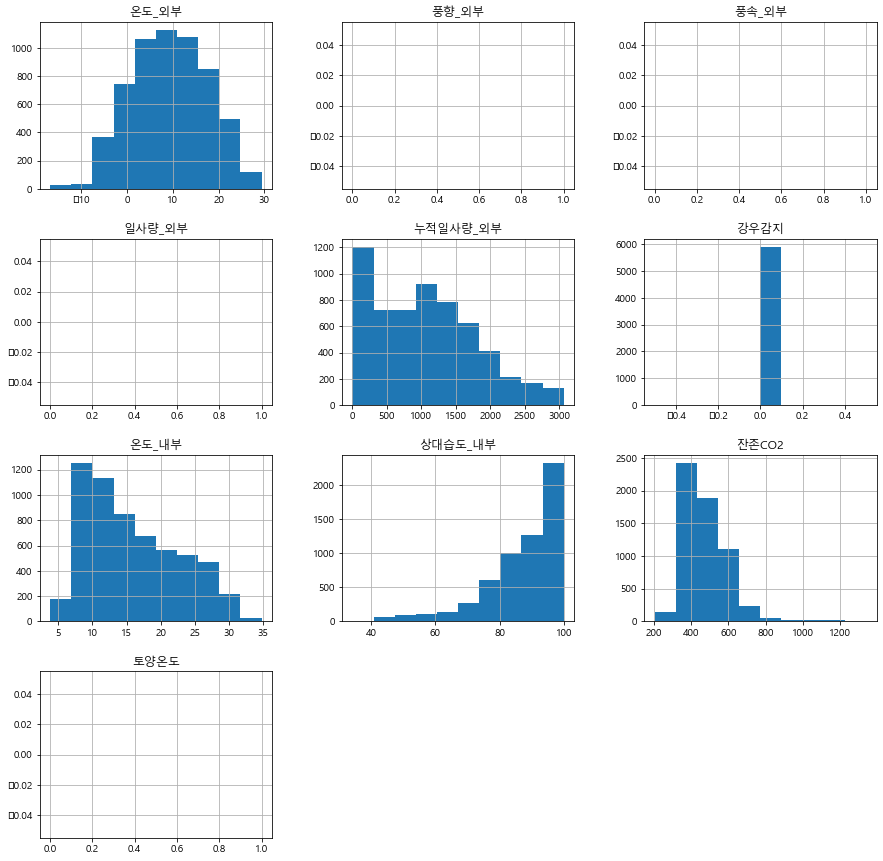

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


41


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


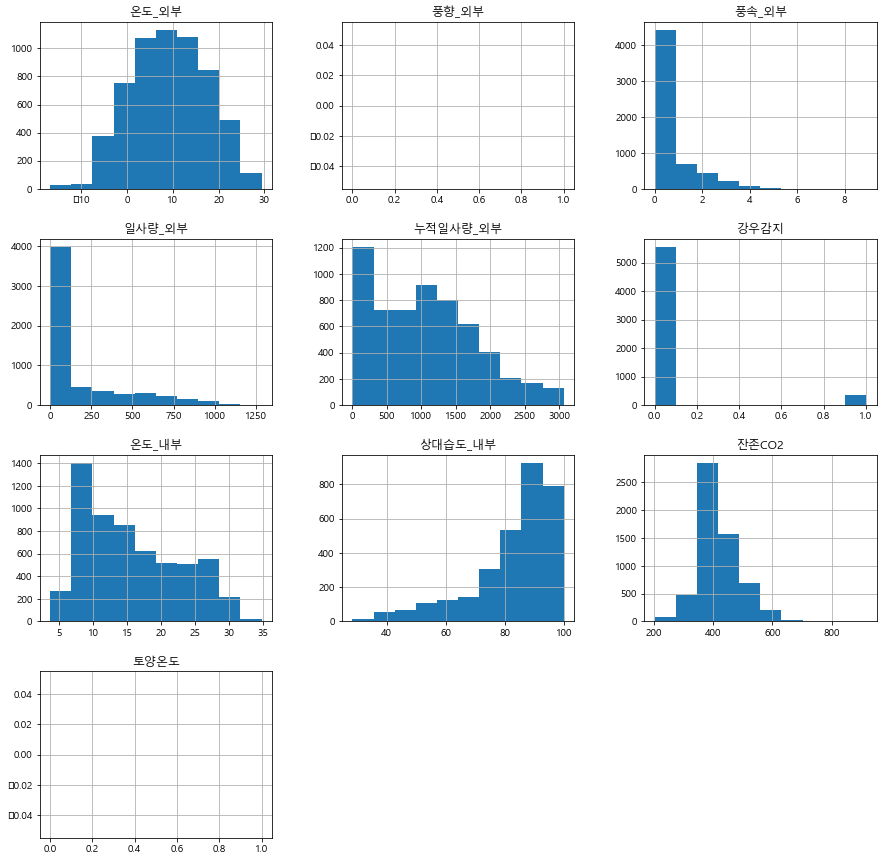

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


43


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


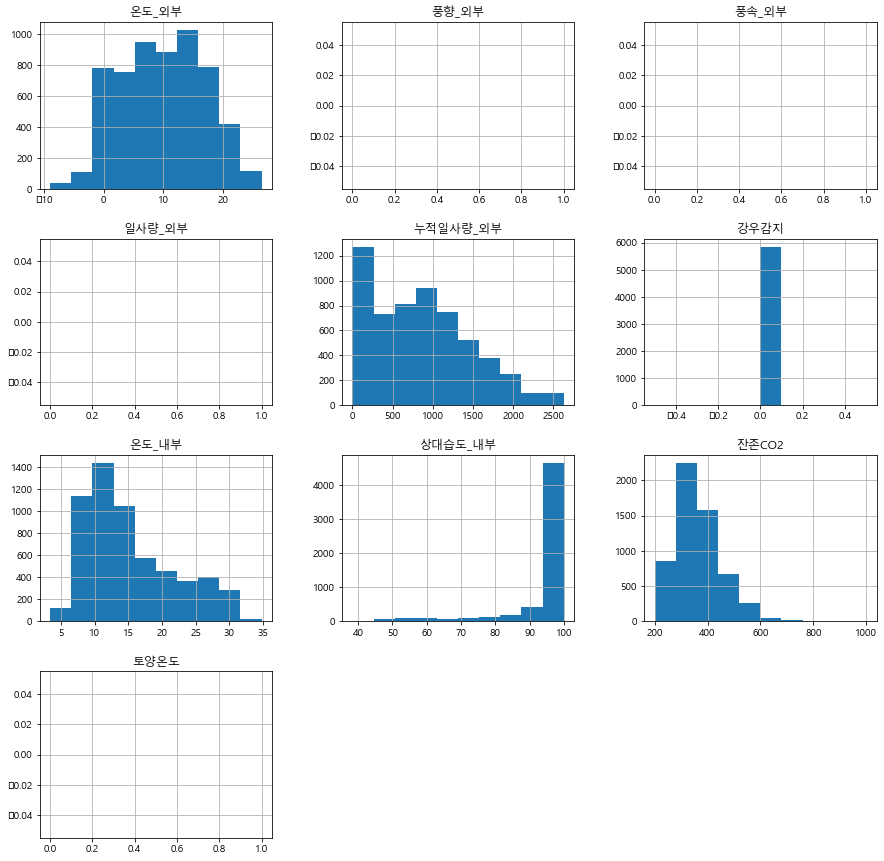

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


44


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


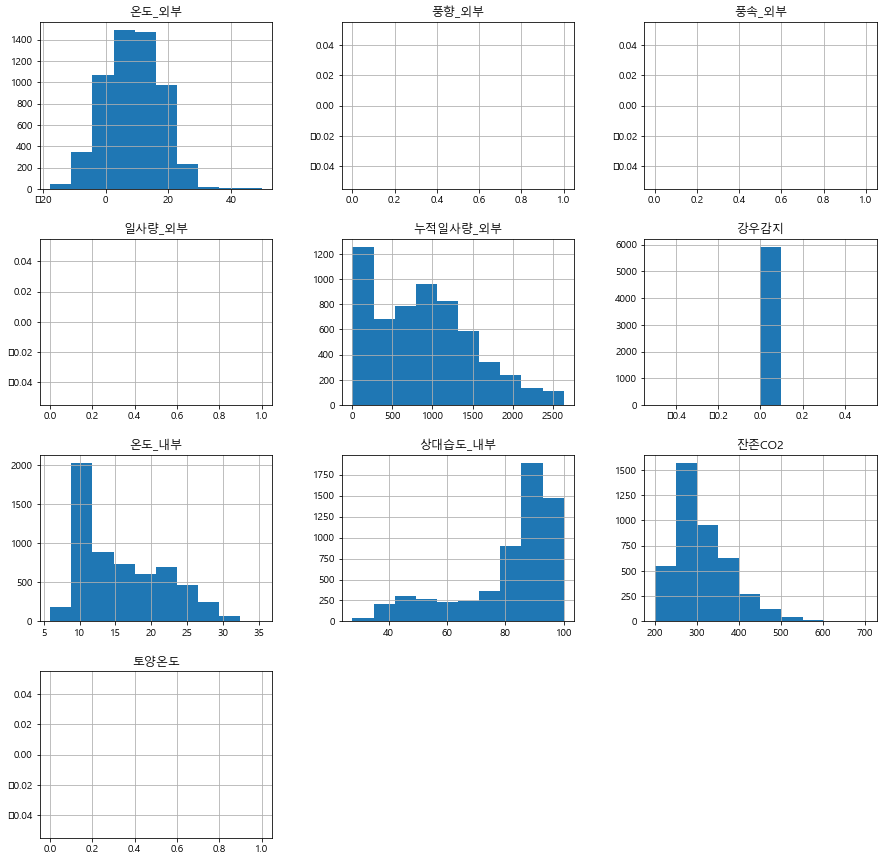

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


47


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


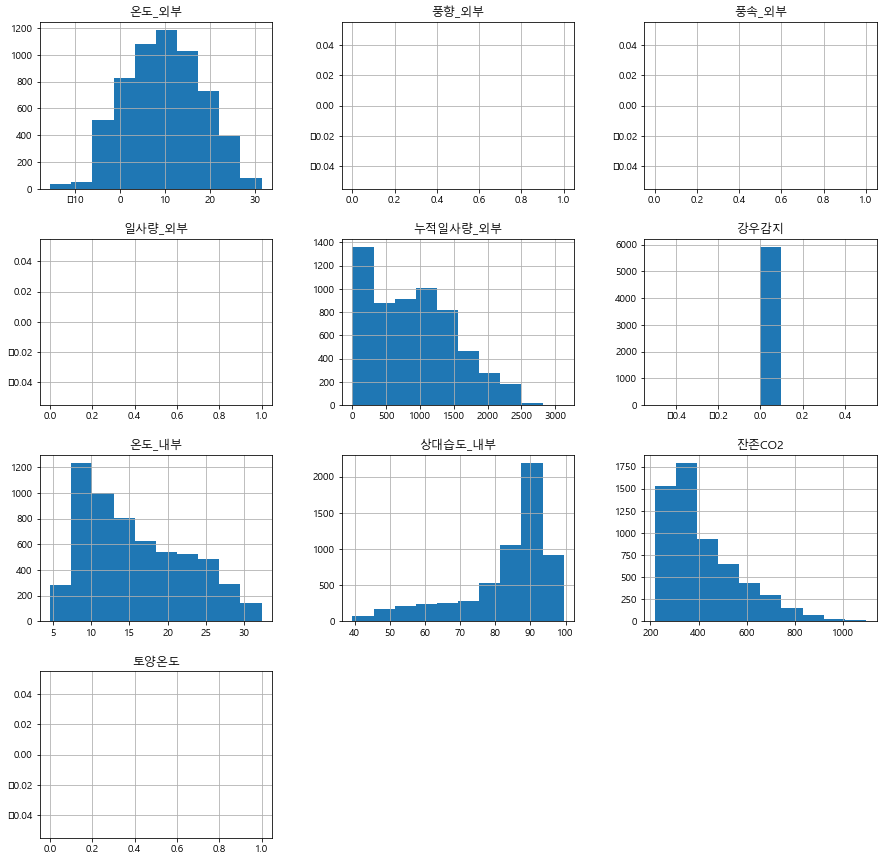

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


19


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


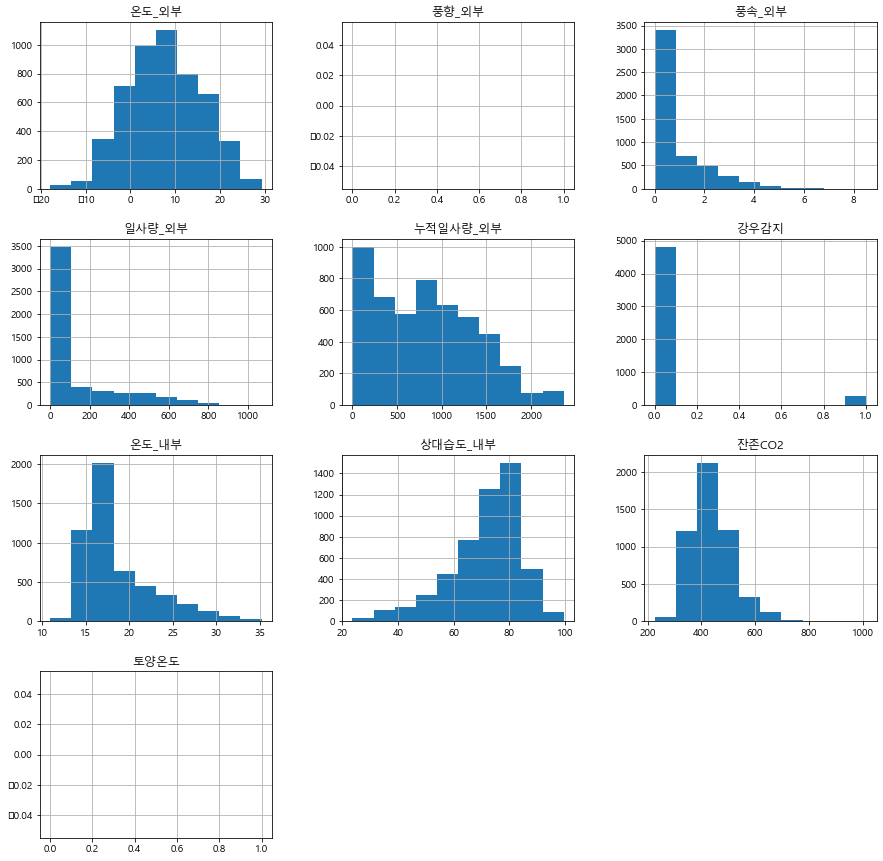

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


20


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


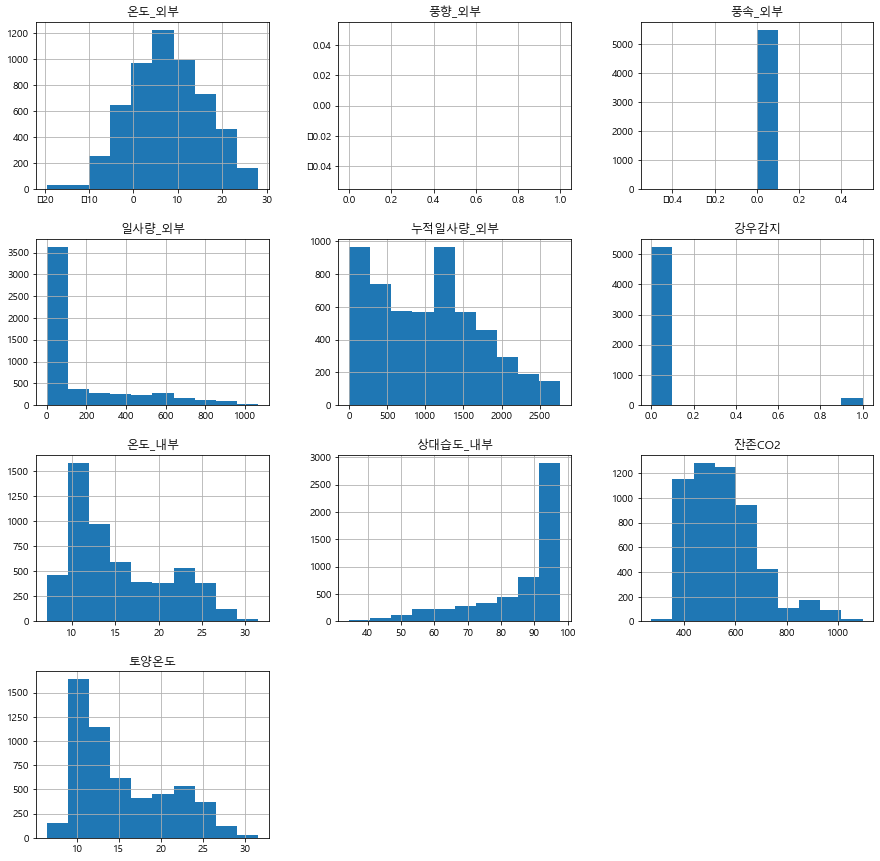

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


21


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


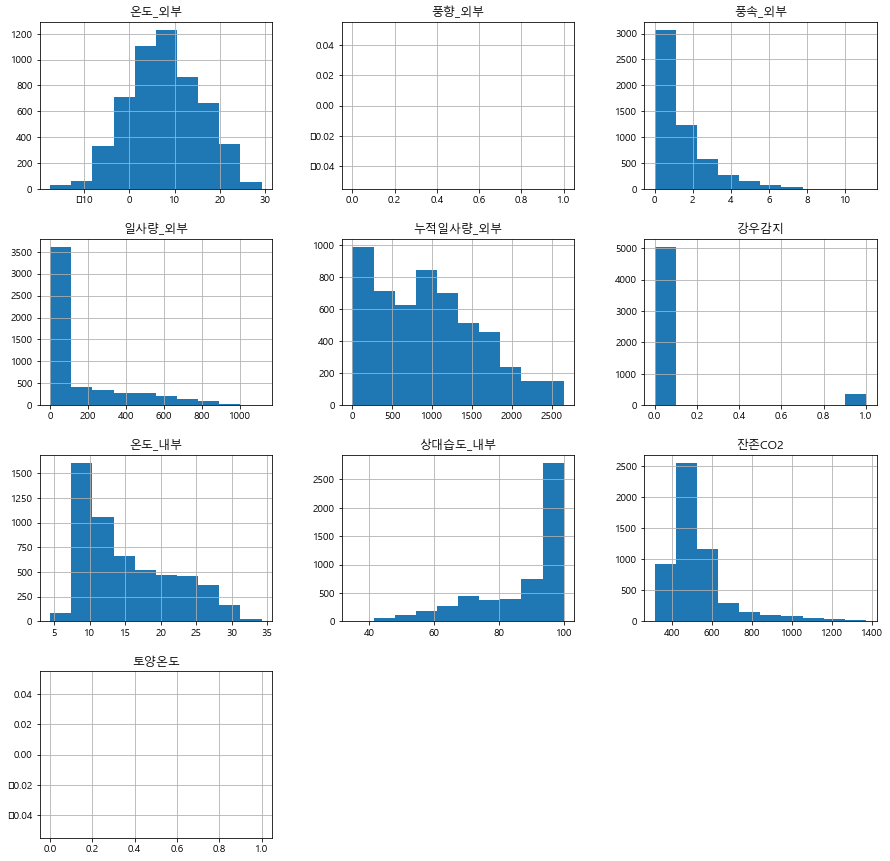

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


22


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


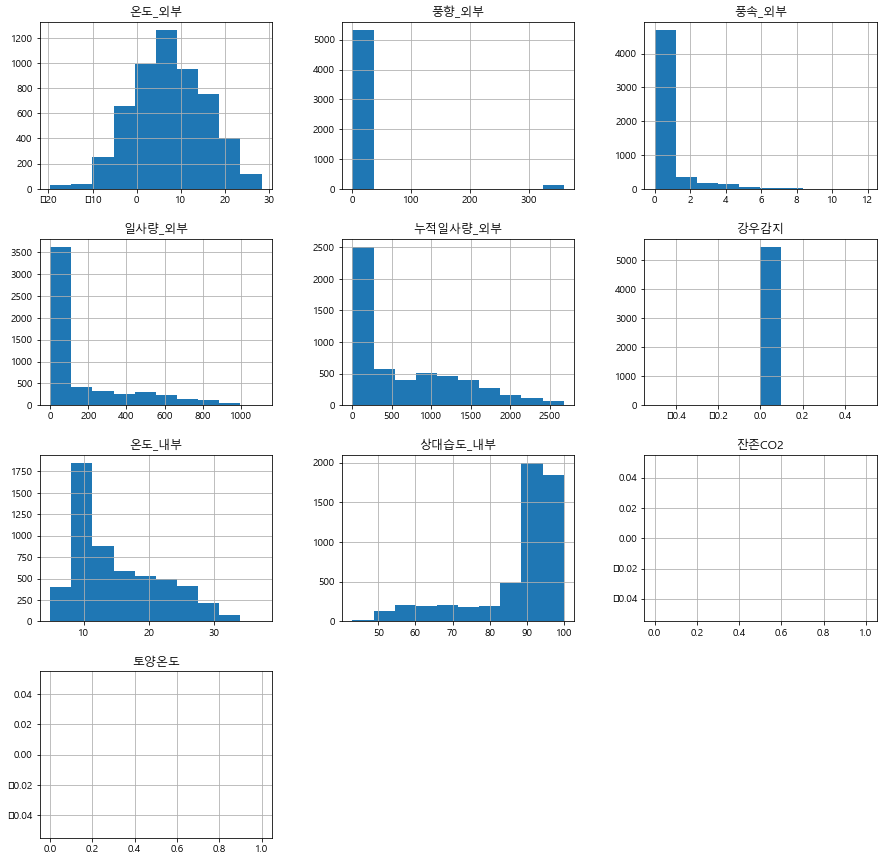

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


23


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


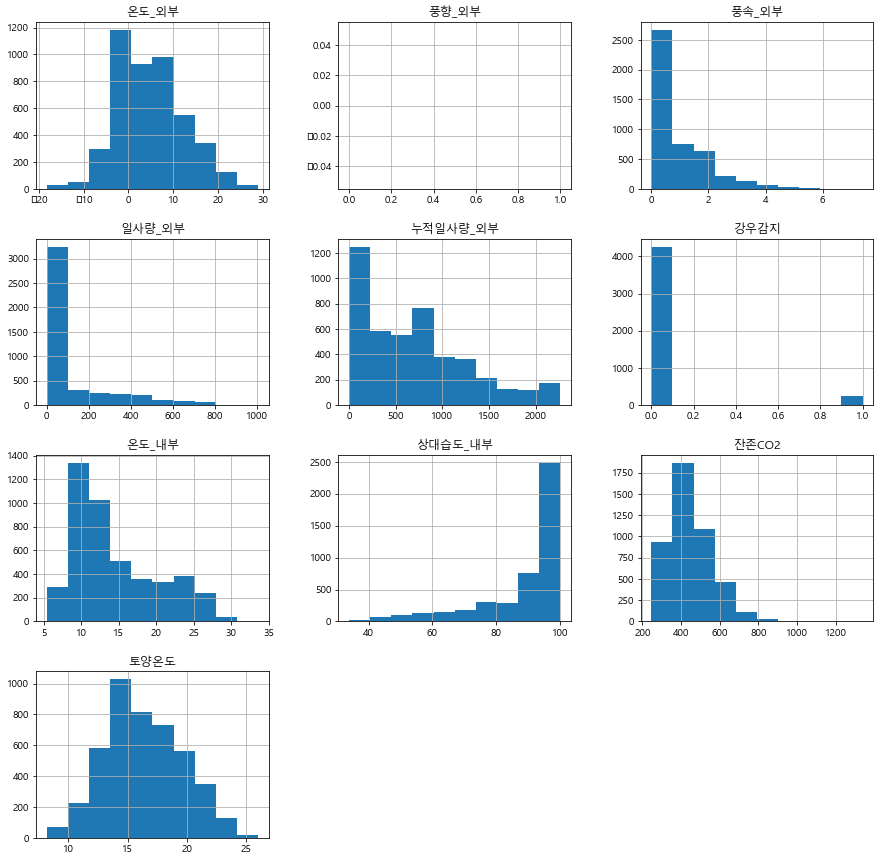

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


25


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


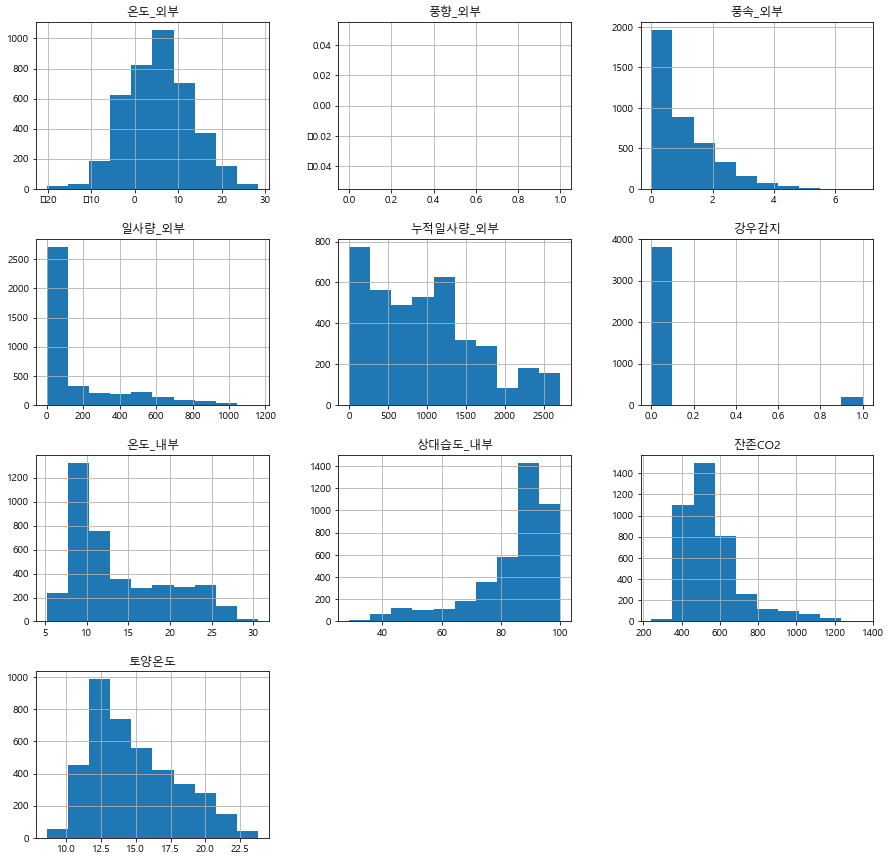

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


27


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


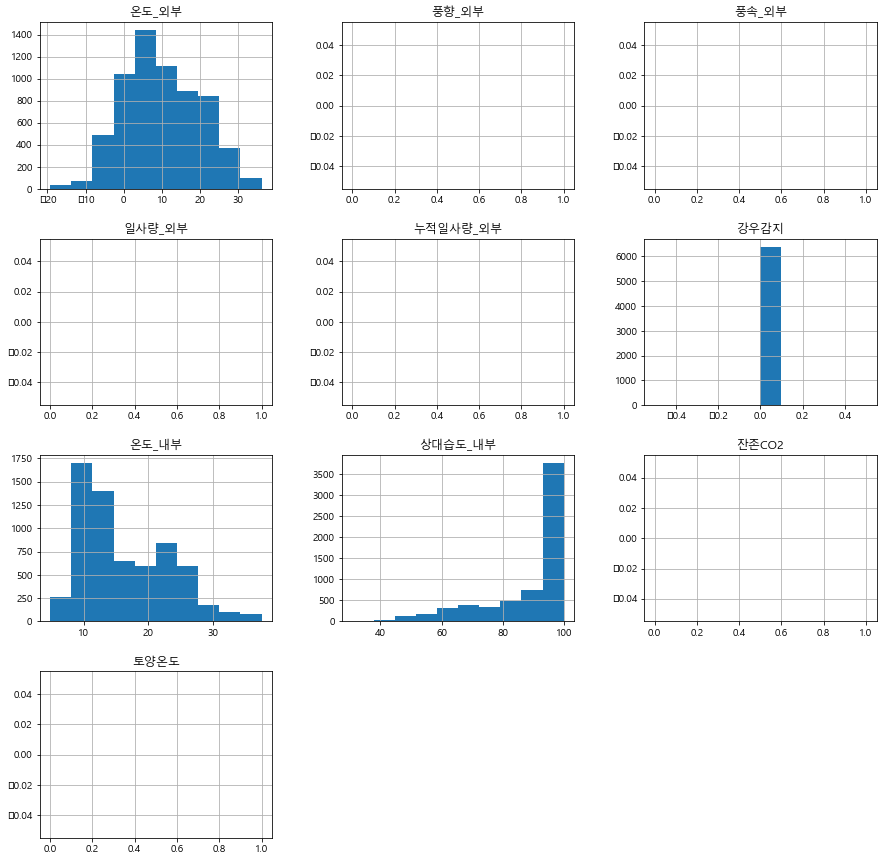

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


24


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


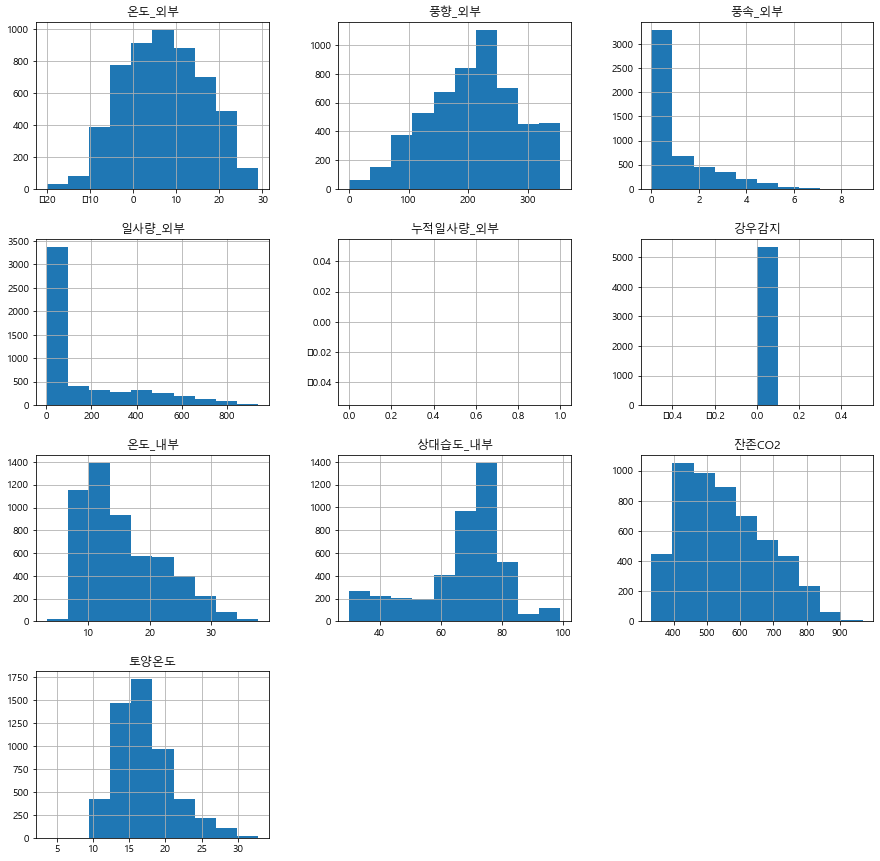

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


26


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


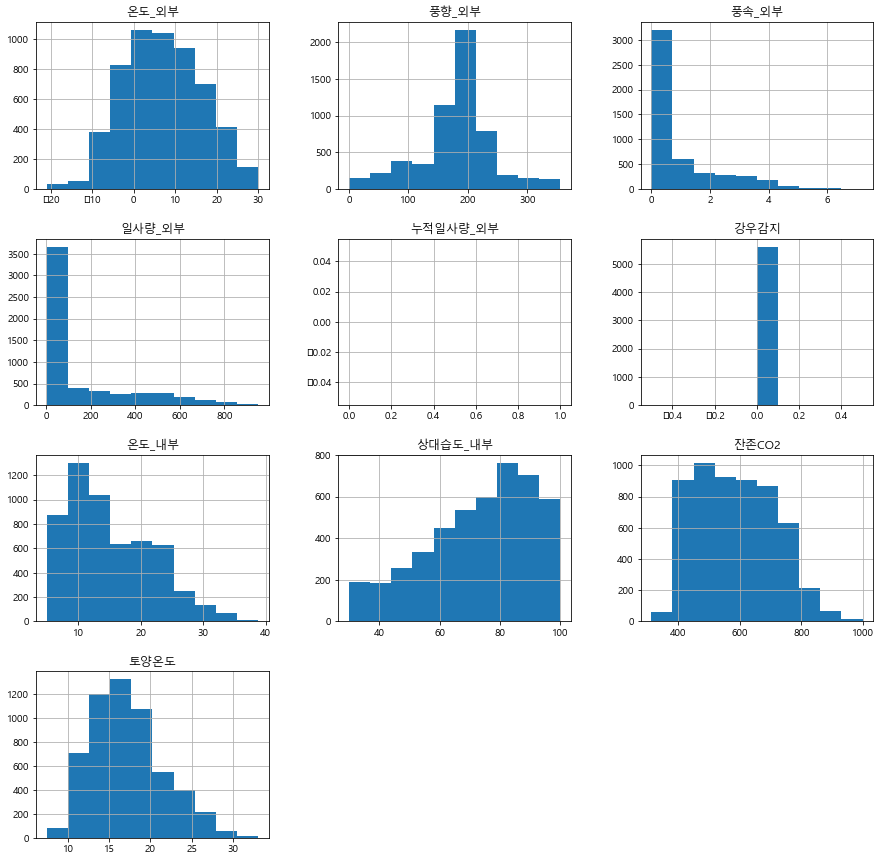

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


28


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


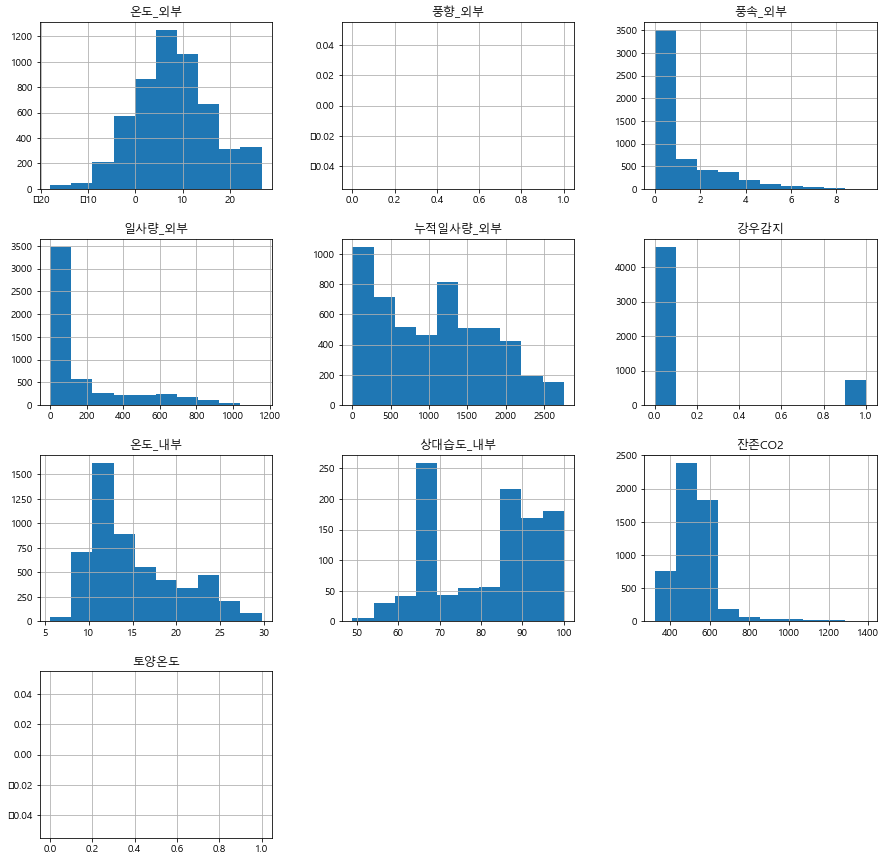

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


9


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


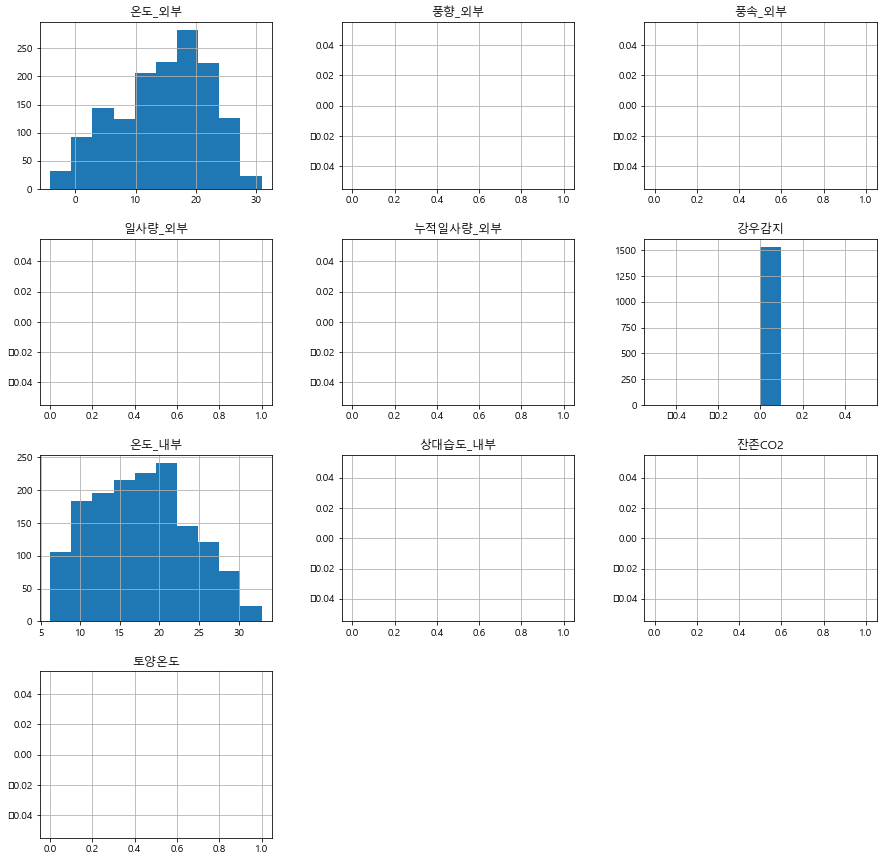

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


14


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


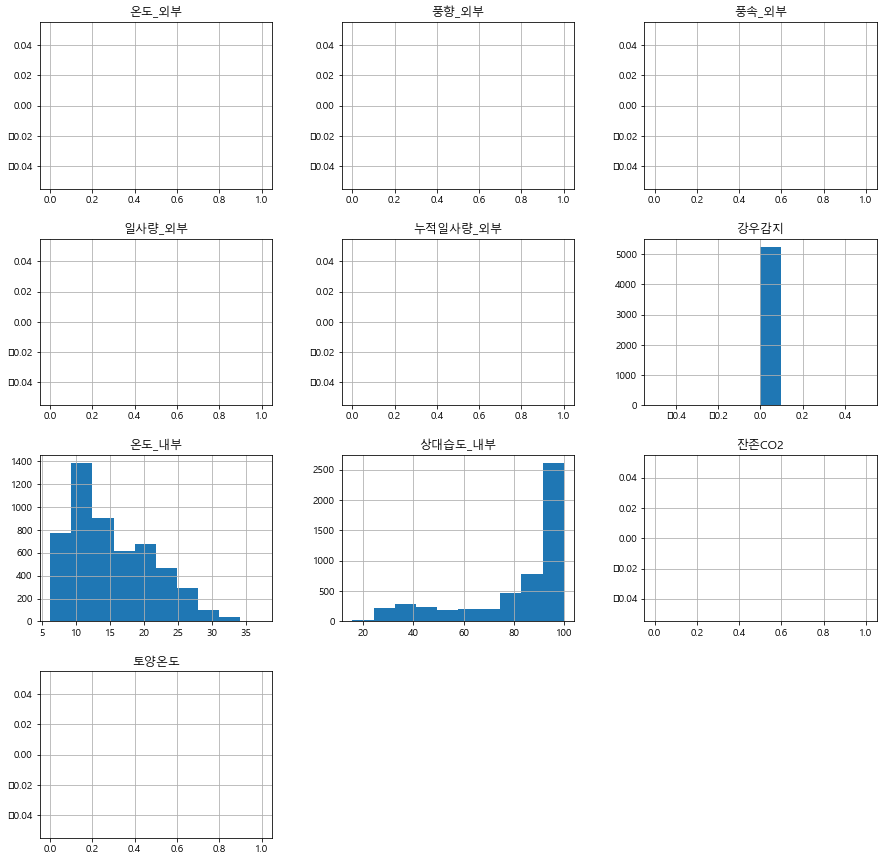

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


16


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


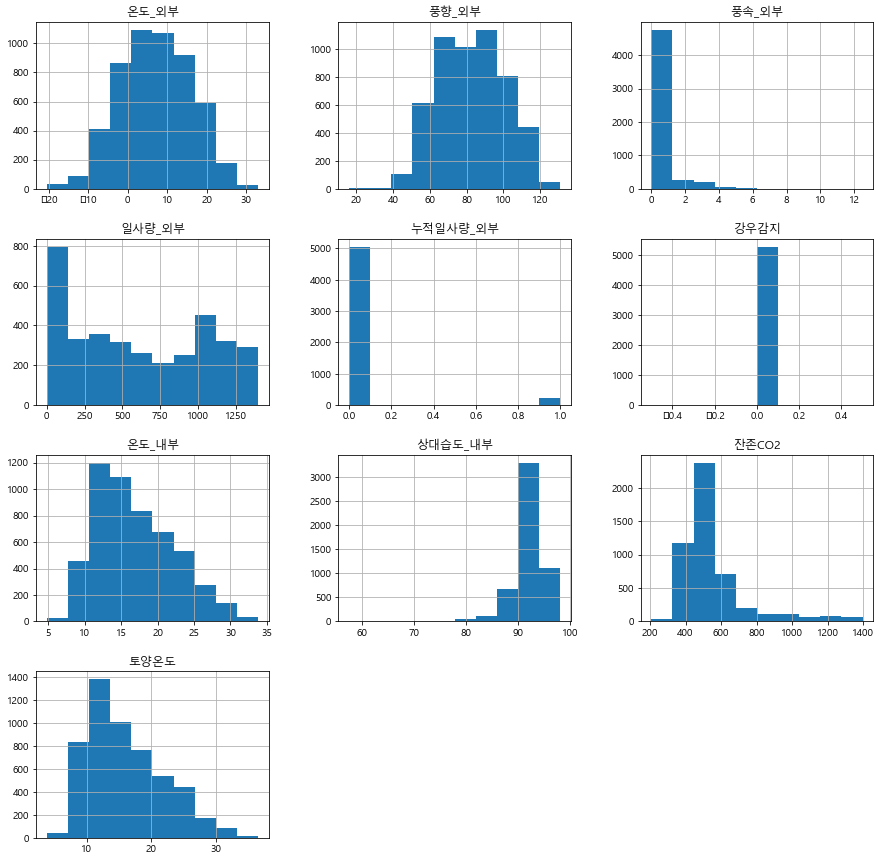

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


18


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


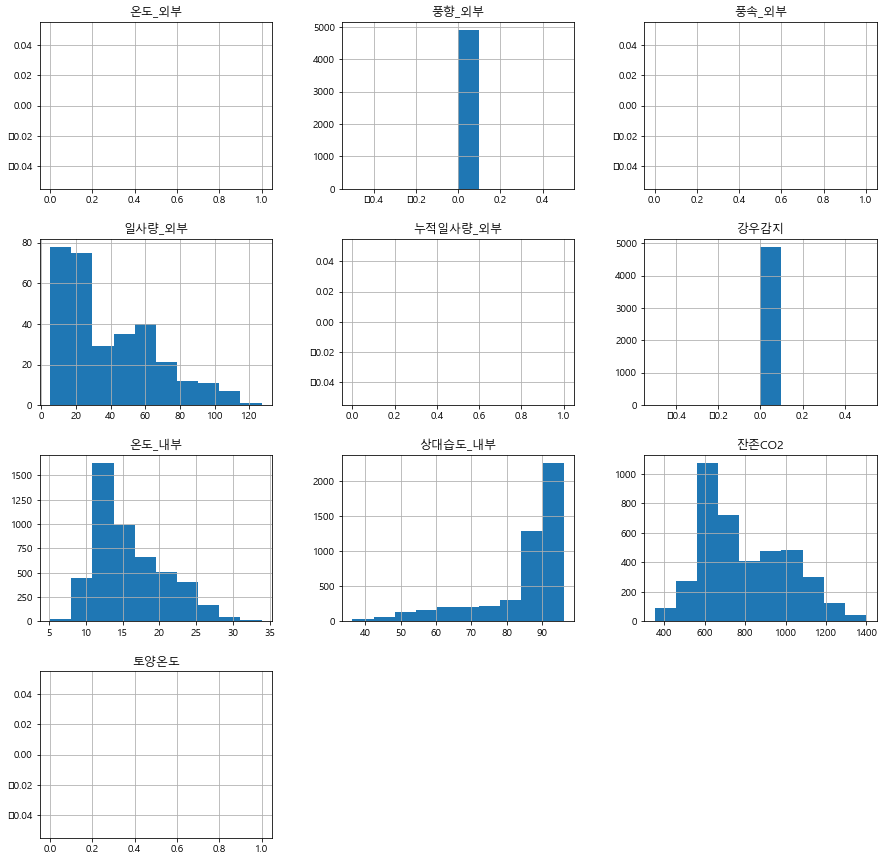

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


15


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


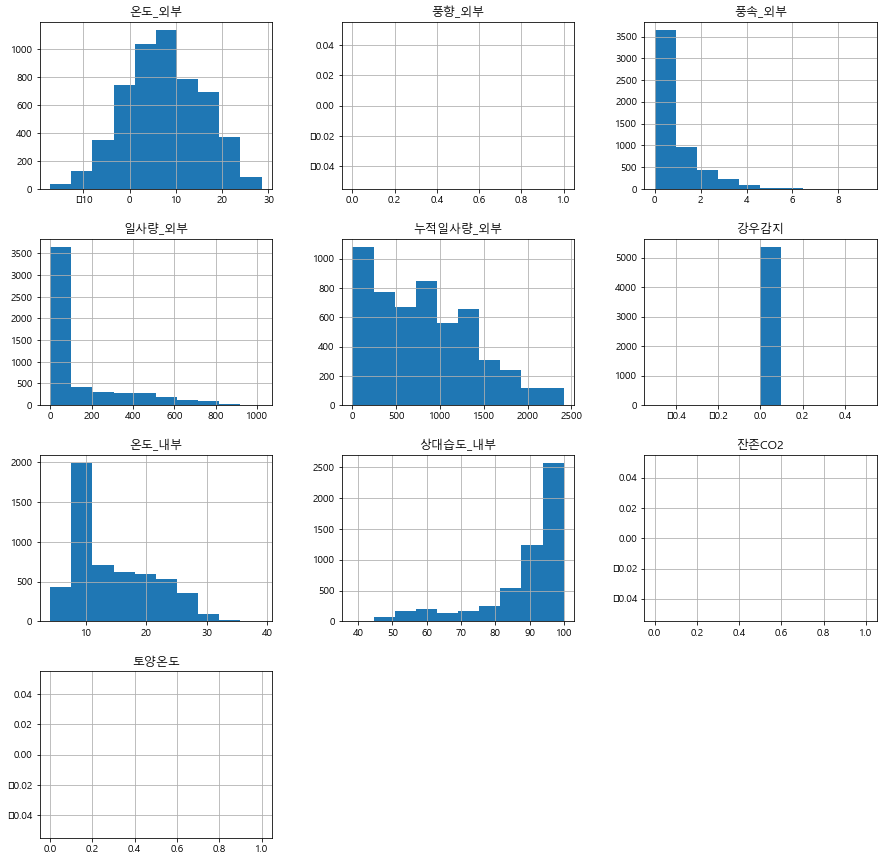

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


17


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


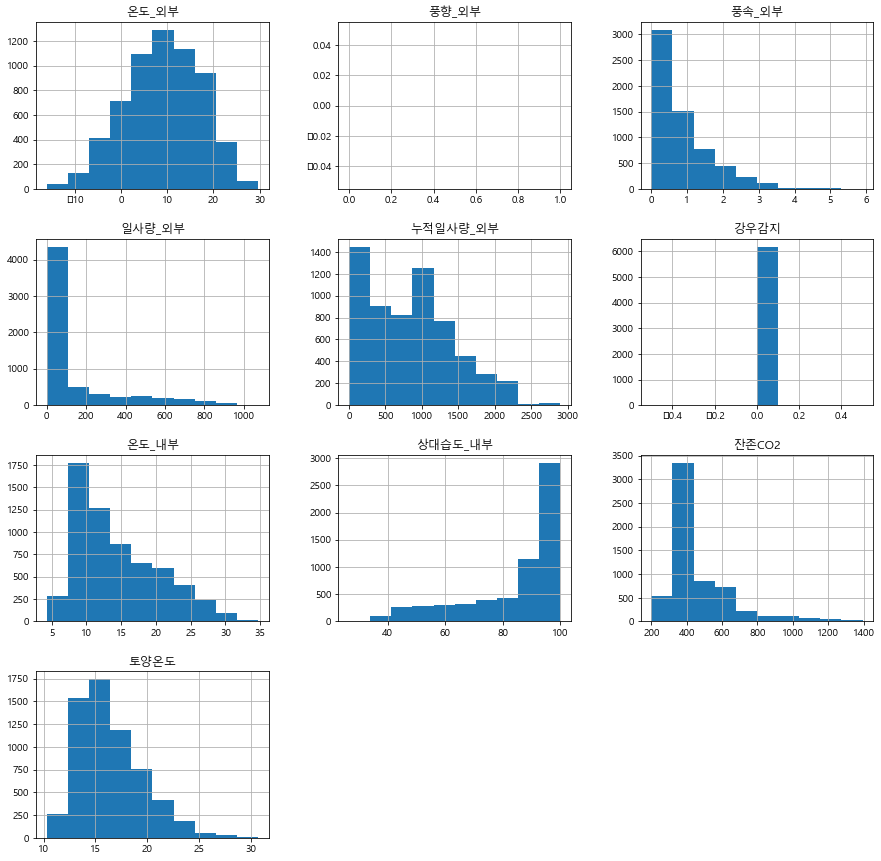

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


7


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


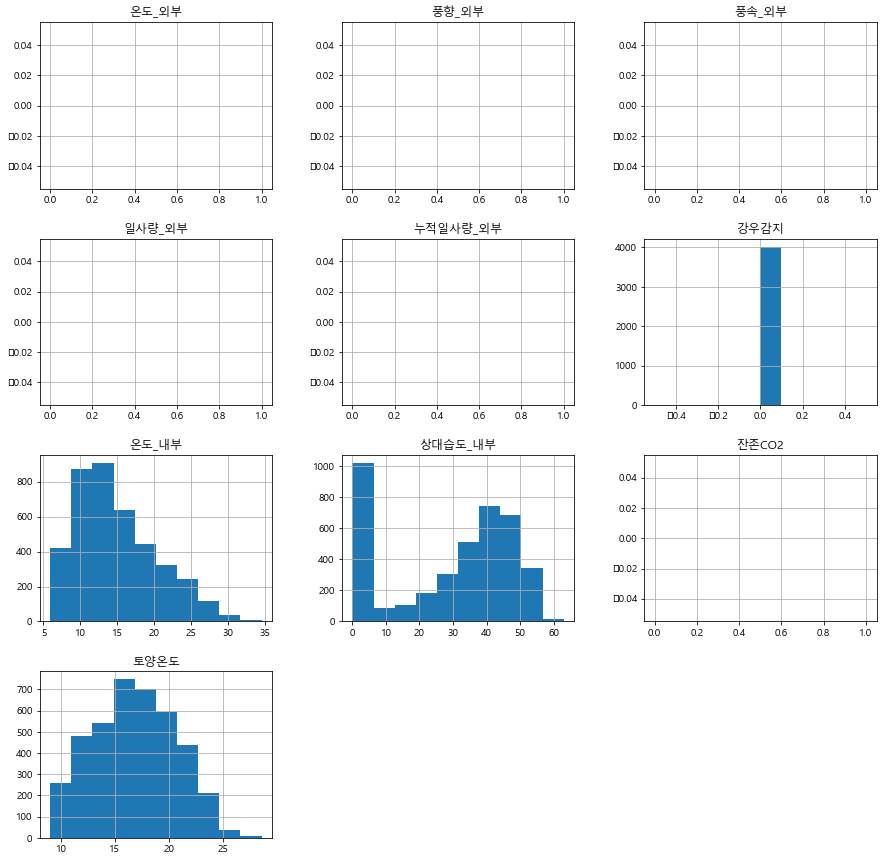

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


11


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


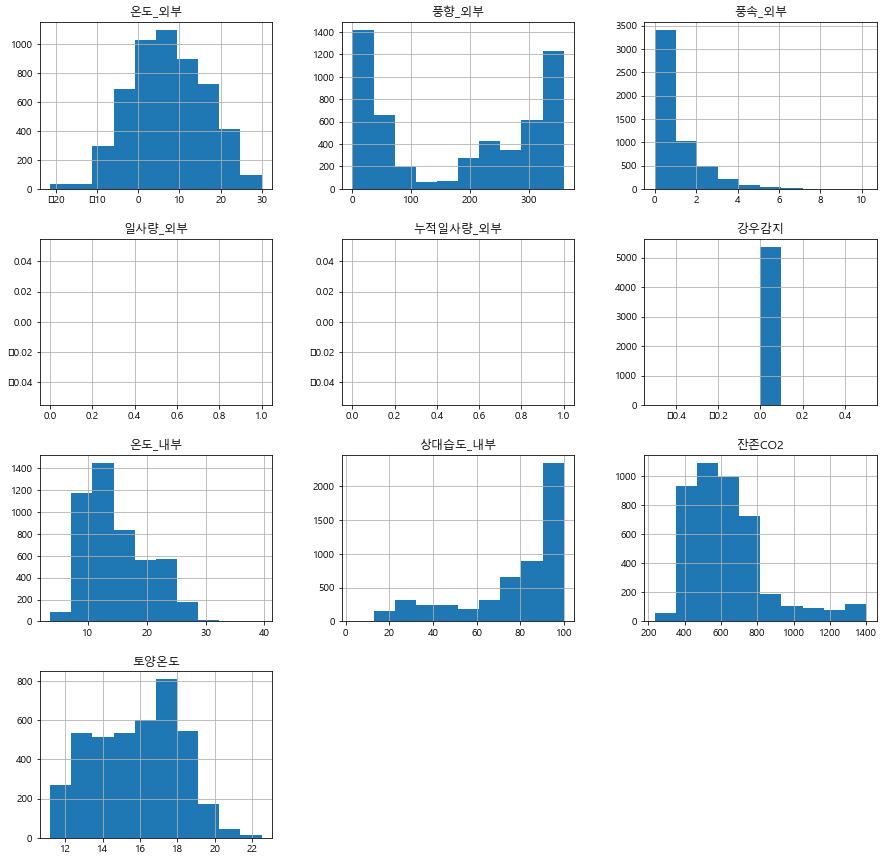

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


6


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


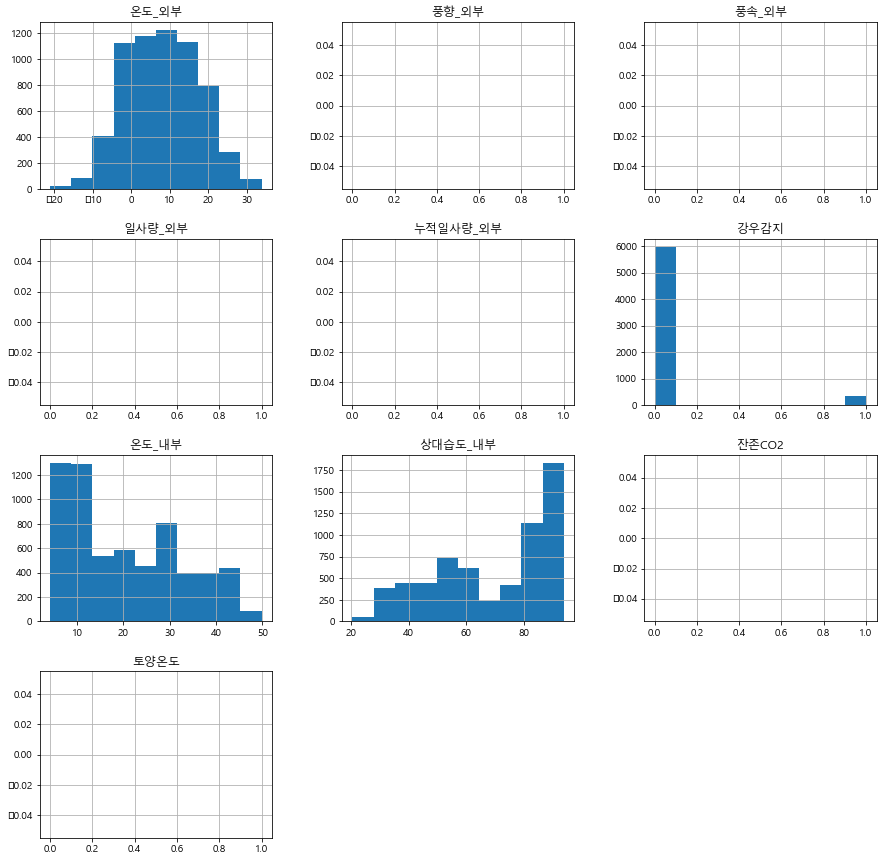

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


10


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


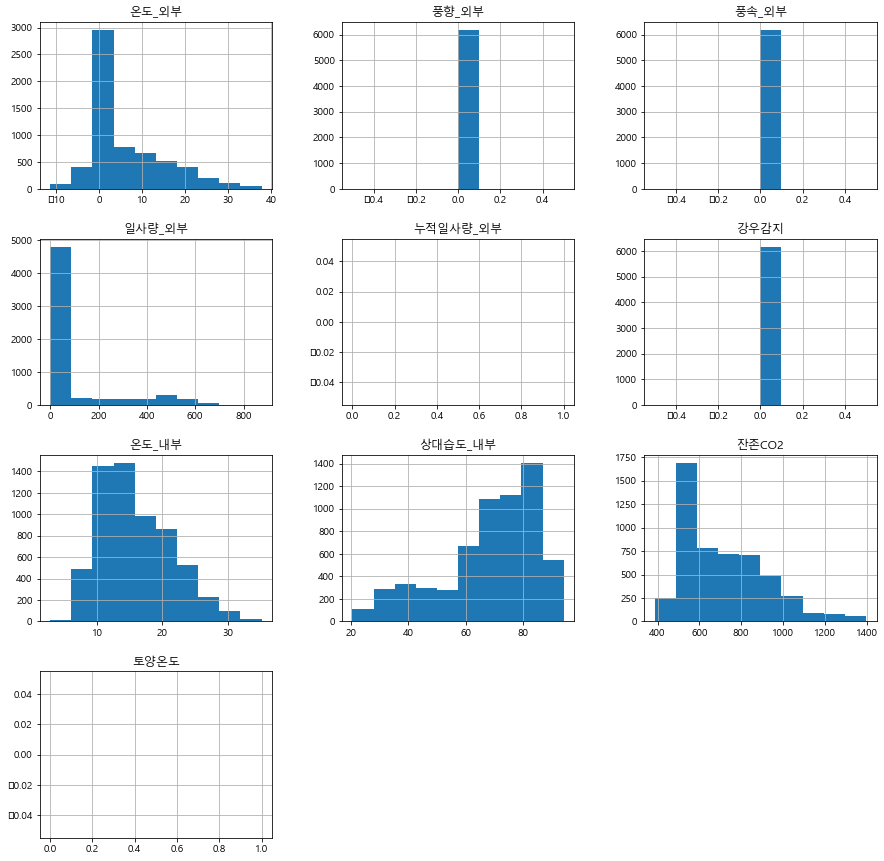

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


12


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


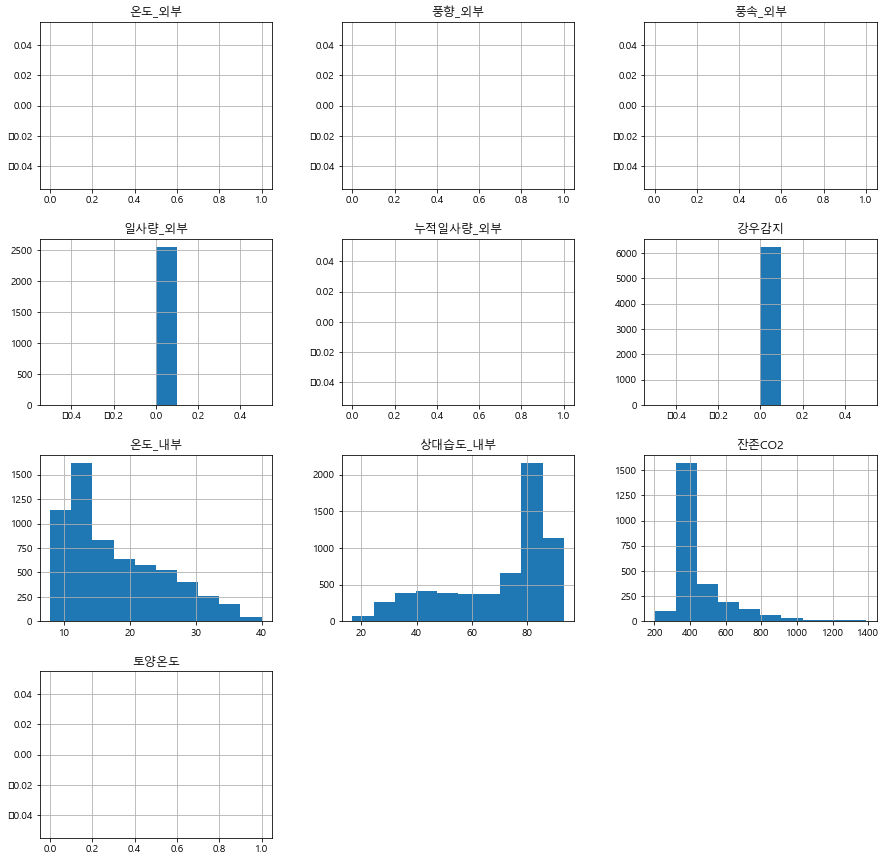

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


13


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


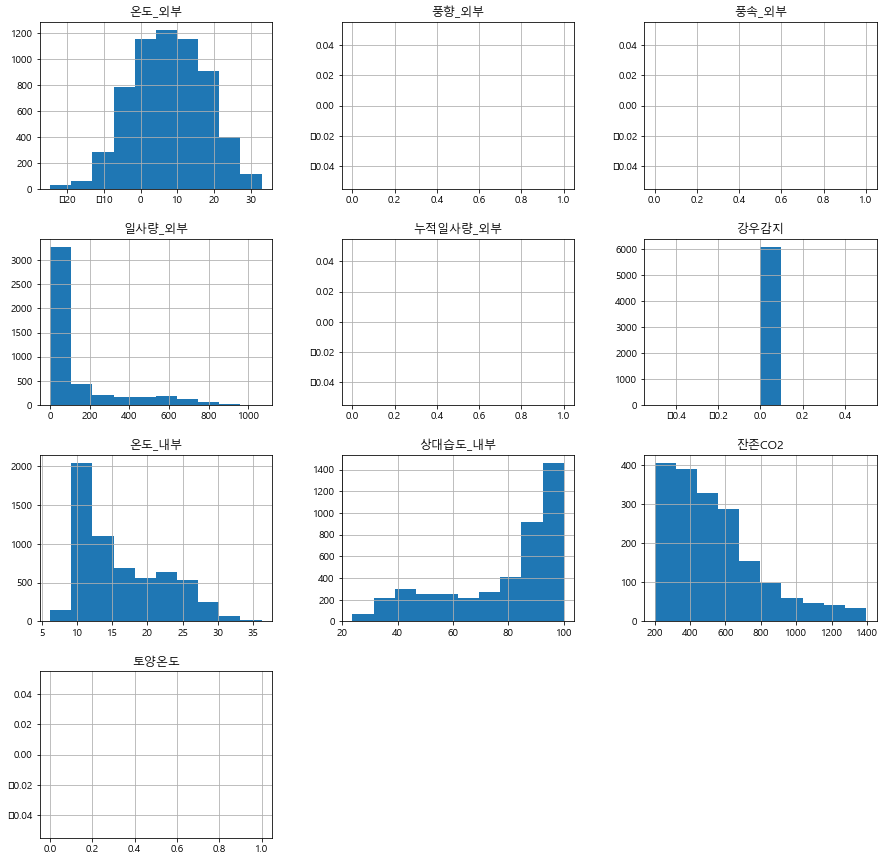

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


3


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


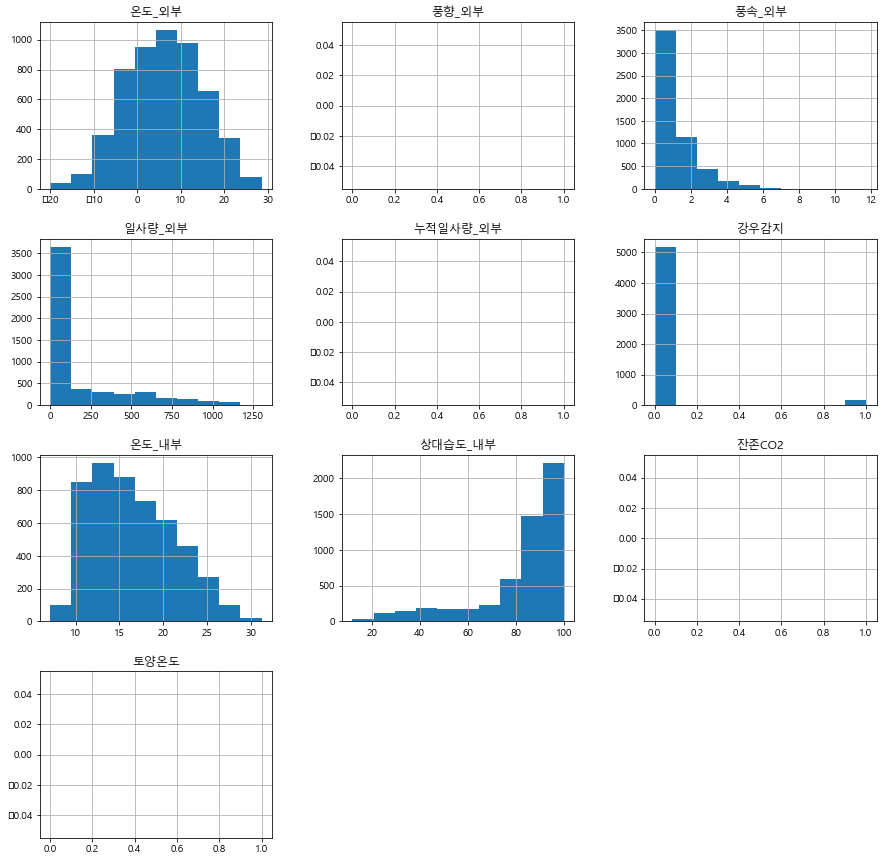

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


2


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


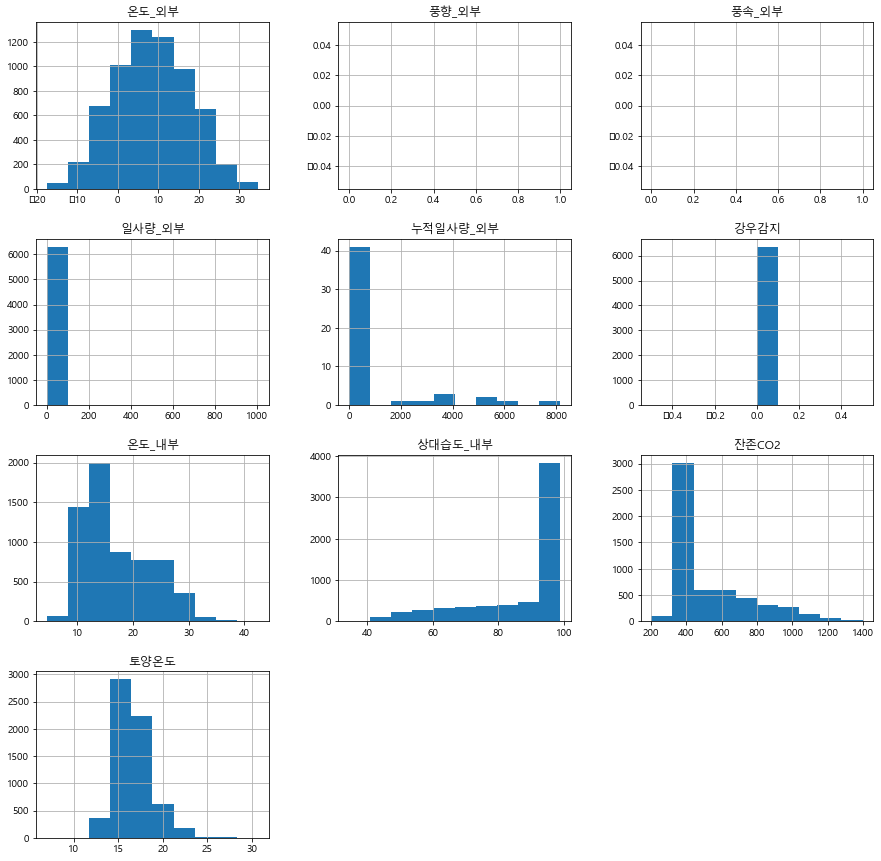

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


4


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


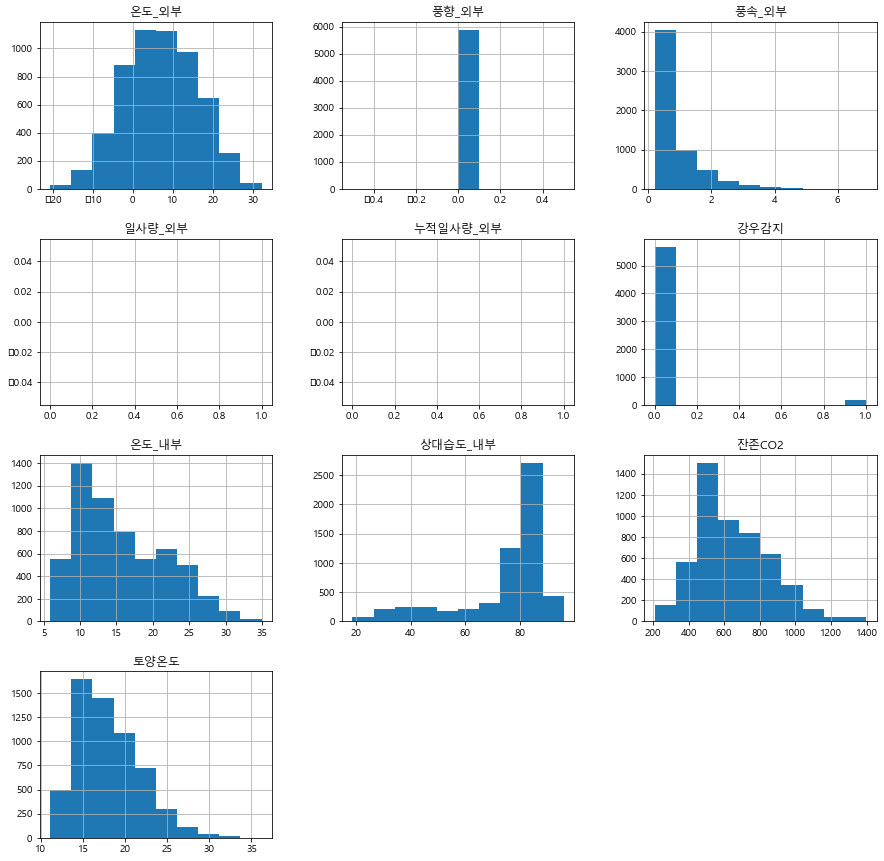

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


5


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


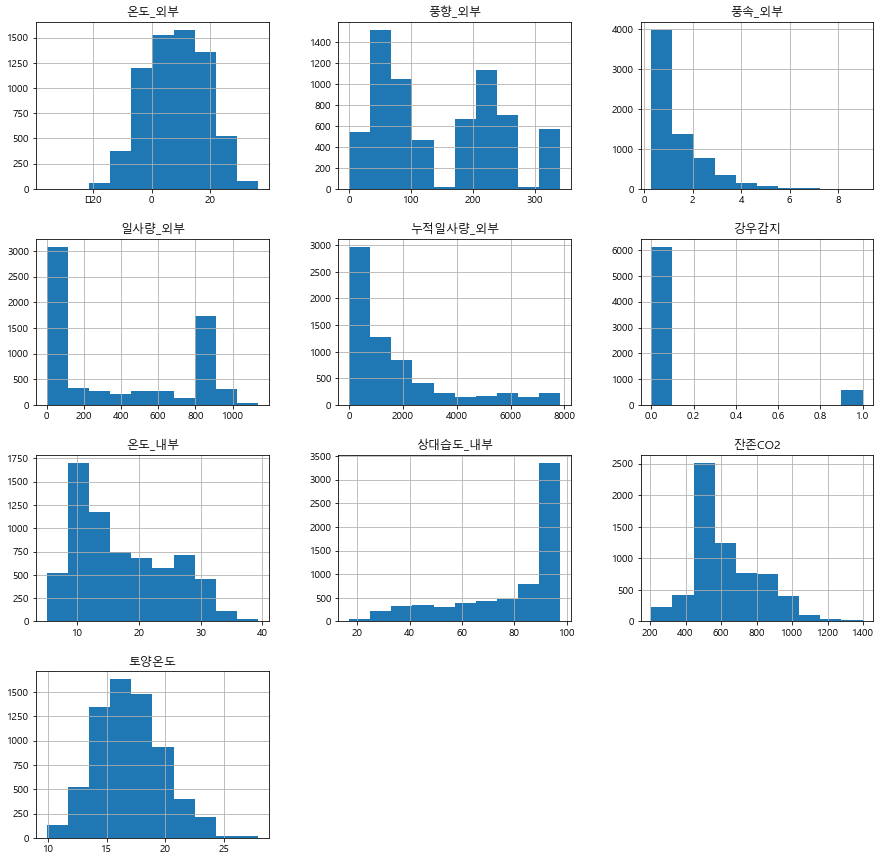

<ipython-input-89-4703ea0152e2>:14: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  sub_df[num_cols].hist(ax=ax)


1


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


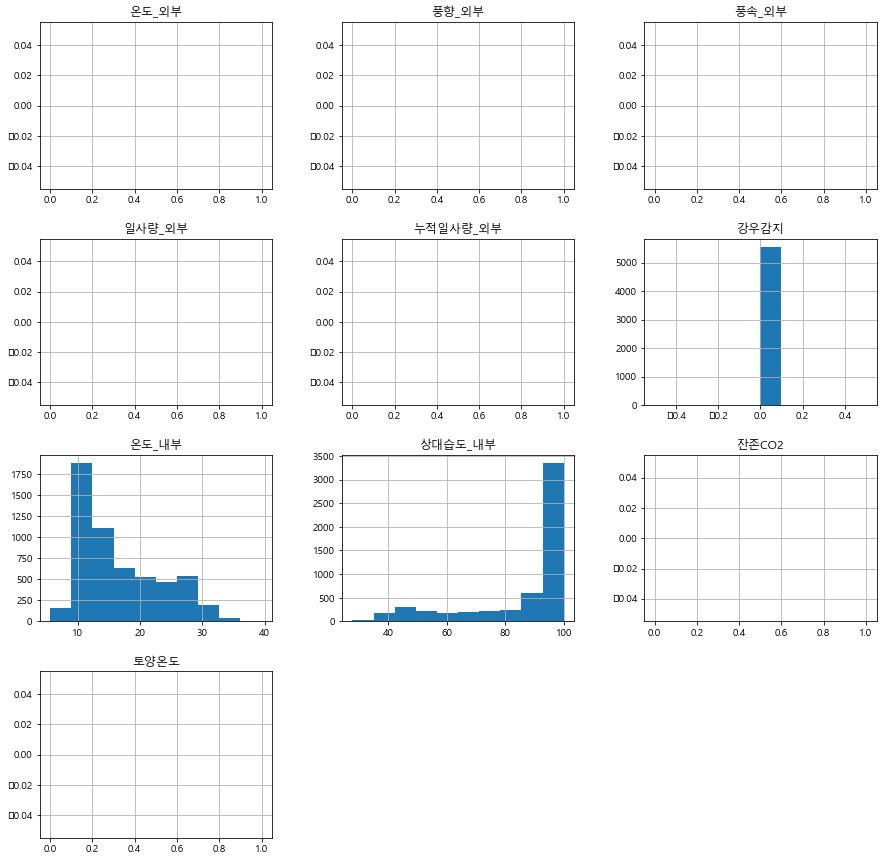

In [89]:
# histogram

for f in farms :
    sub_df = df[df["농가명"] == f]

    ### figsize()는 plot()의 기본 크기를 지정
    fig = plt.figure(figsize = (15, 15))

    plt.rcParams.update({'font.size': 10})  # 폰트 크기를 10으로 설정

    ax = fig.gca()  # Axes 생성

    ### gca()
    ### gca()로 현재의 Axes를, gcf()로 현재의 Figure 객체를 구할 수 있다.

    sub_df[num_cols].hist(ax=ax)
    print(f)
    plt.savefig(f"2020/1.환경/plot/col_hist_null_{f}.png")
    plt.show()
    plt.close()  # 그림 닫기

In [10]:
df.head()

,realTime,농가명,도,시군,품목,작기,측정시간,온도_외부,풍향_외부,풍속_외부,일사량_외부,누적일사량_외부,강우감지,온도_내부,상대습도_내부,잔존CO2,토양온도
0,2020-09-15 0:00,2,충북,옥천,딸기,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-09-15 1:00,2,충북,옥천,딸기,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-09-15 2:00,2,충북,옥천,딸기,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-09-15 3:00,2,충북,옥천,딸기,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-09-15 4:00,2,충북,옥천,딸기,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


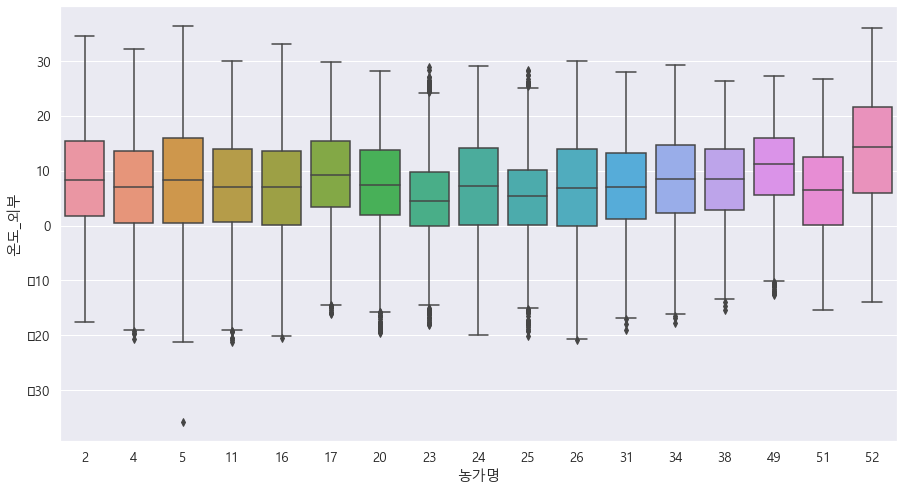

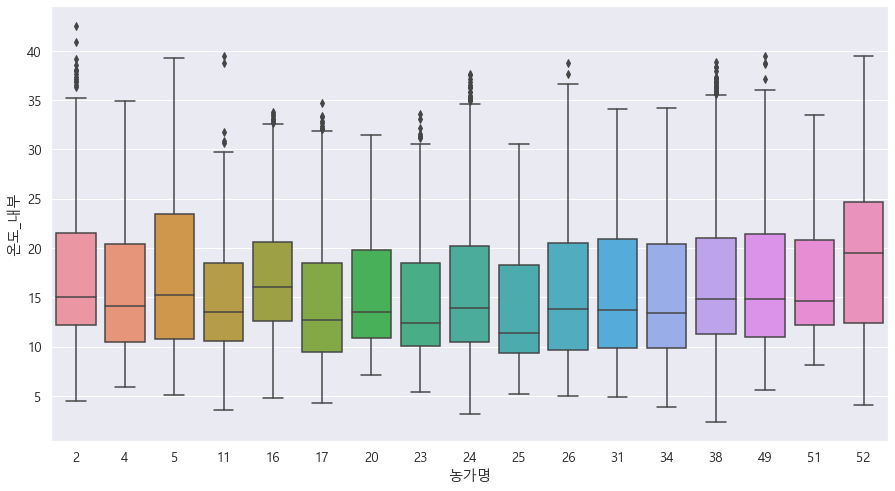

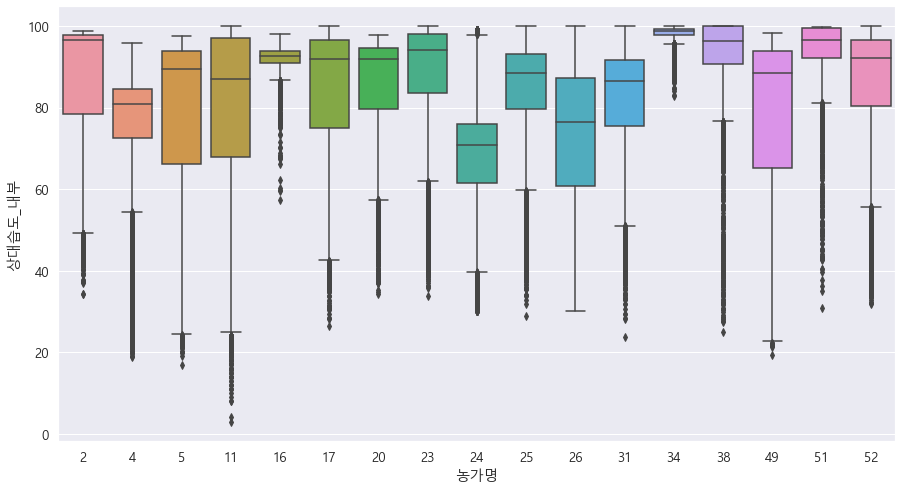

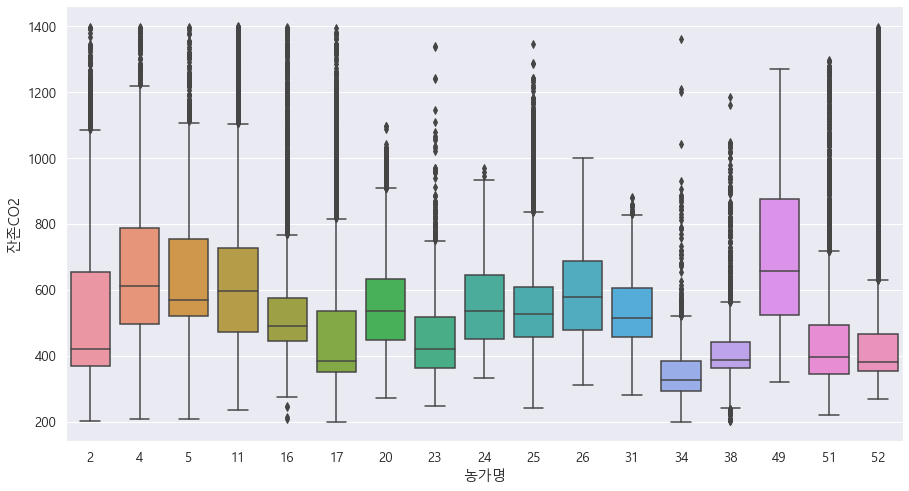

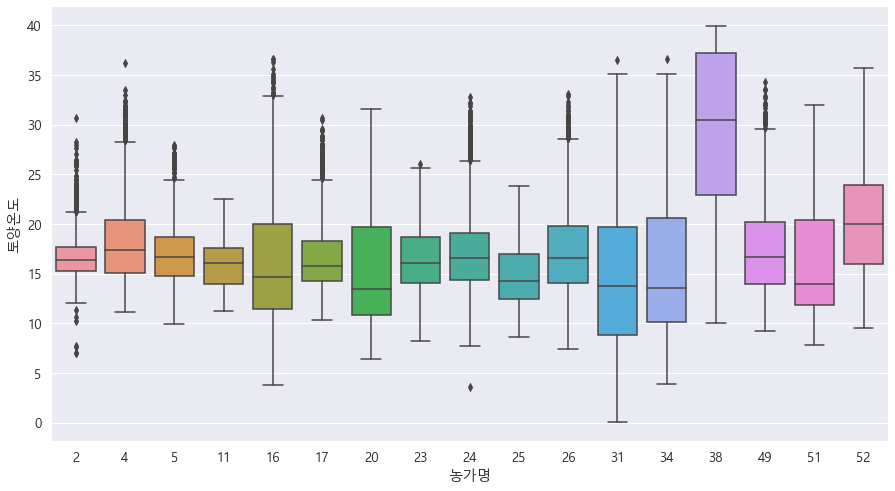

In [25]:
# box plot

# 변수 별, 농가 별

for c in num_cols :
    plt.figure(figsize=(15, 8))
    sns.boxplot(x="농가명", y=c, data=df)
    
    plt.savefig(f"2020/1.환경/plot/col_boxplot_{c}.png")
    plt.show()

기상데이터랑 비교

In [52]:
weather_df = pd.read_csv("OBS_ASOS_TIM_20231015195839.csv", encoding="ANSI")
df = pd.read_csv("2020/1.환경/2020_환경_딸기_1차_농가_선정_누락 시간대 포함.csv", encoding="ANSI")

In [53]:
df_5 = df[df["농가명"]==5]

In [54]:
df_5["realTime"] = pd.to_datetime(df_5["realTime"])
weather_df["일시"] = pd.to_datetime(weather_df["일시"])

<ipython-input-54-6cd41e04626a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_5["realTime"] = pd.to_datetime(df_5["realTime"])


In [55]:
df_5 = df_5.loc[df_5["realTime"] < "2021-06-11"]

In [56]:
df_5.head()

,realTime,농가명,도,시군,품목,작기,측정시간,온도_외부,풍향_외부,풍속_외부,일사량_외부,누적일사량_외부,강우감지,온도_내부,상대습도_내부,잔존CO2,토양온도
12288,2020-09-06 00:00:00,5,충북,진천,딸기,1,2020-09-06 0:00,16.7,138.0,0.9,908.0,0.0,1.0,19.8,86.5,552.0,20.9
12289,2020-09-06 01:00:00,5,충북,진천,딸기,1,2020-09-06 1:00,16.7,251.0,0.7,908.0,321.0,1.0,19.7,86.2,555.0,20.8
12290,2020-09-06 02:00:00,5,충북,진천,딸기,1,2020-09-06 2:00,16.1,2.0,0.7,908.0,648.0,1.0,19.4,89.3,597.0,20.7
12291,2020-09-06 03:00:00,5,충북,진천,딸기,1,2020-09-06 3:00,16.2,2.0,0.7,908.0,975.0,1.0,19.2,89.9,576.0,20.6
12292,2020-09-06 04:00:00,5,충북,진천,딸기,1,2020-09-06 4:00,16.1,2.0,0.3,908.0,1301.0,1.0,19.3,89.4,588.0,20.5


In [63]:
df_5_weather = df_5[["realTime", "온도_외부", "풍향_외부", "풍속_외부", "강우감지"]]

In [58]:
weather_df = weather_df[["일시", "기온(°C)", "풍향(16방위)", "풍속(m/s)","강수량(mm)"]]

In [ ]:
date = df_5_weather["realTime"]

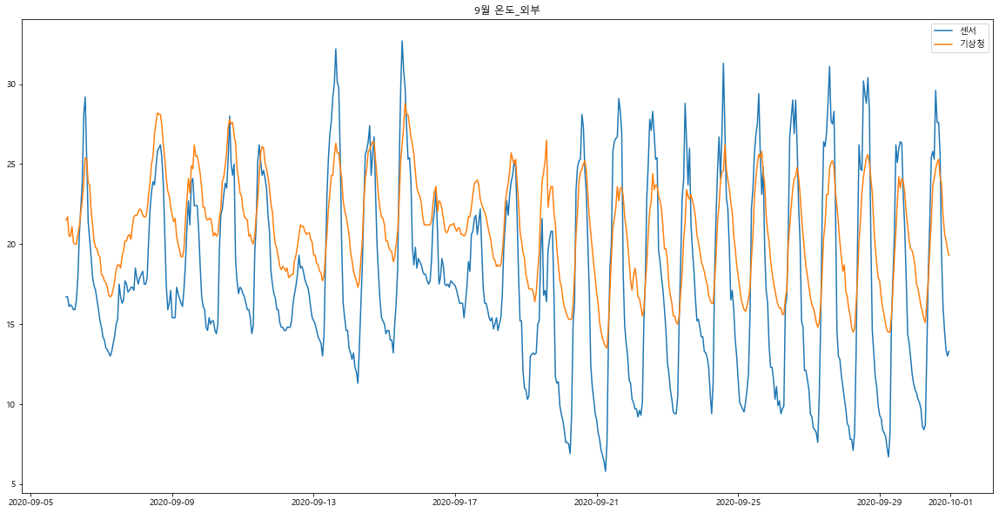

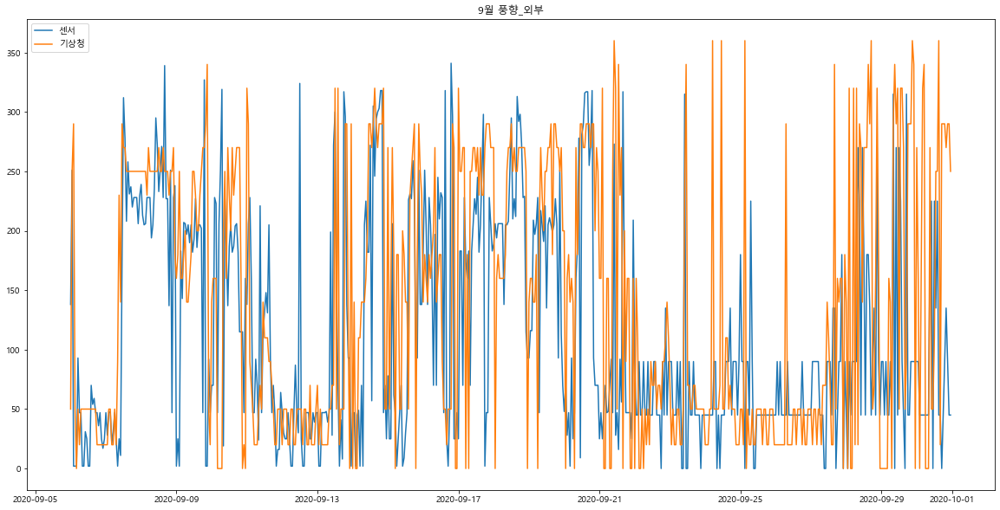

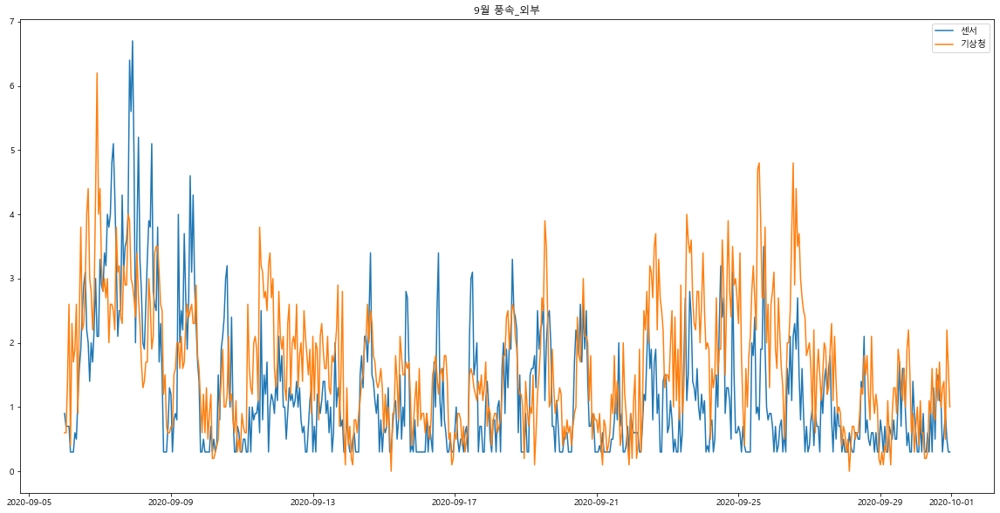

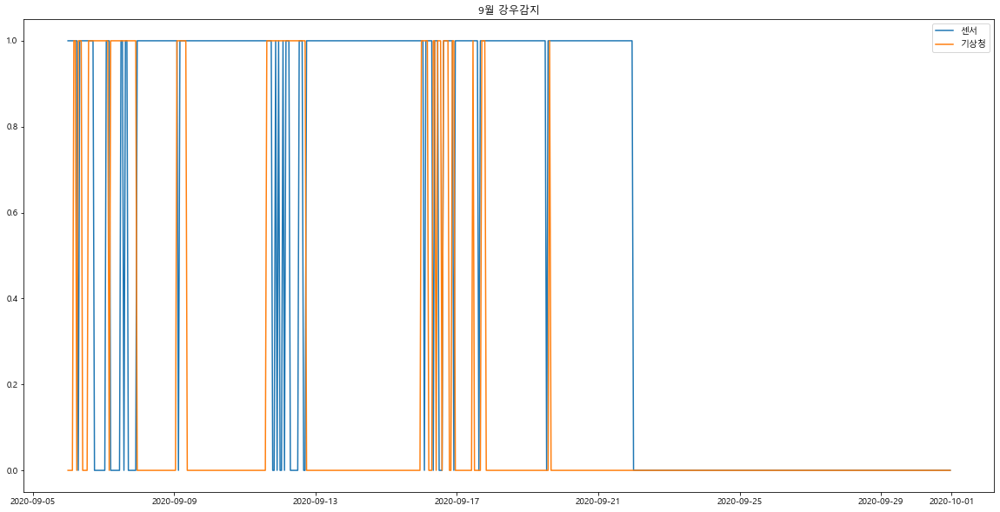

c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


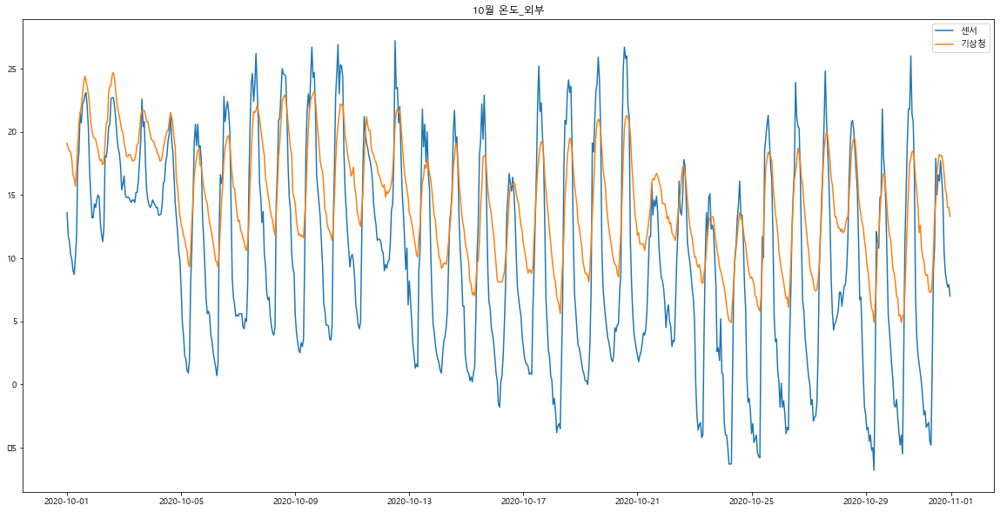

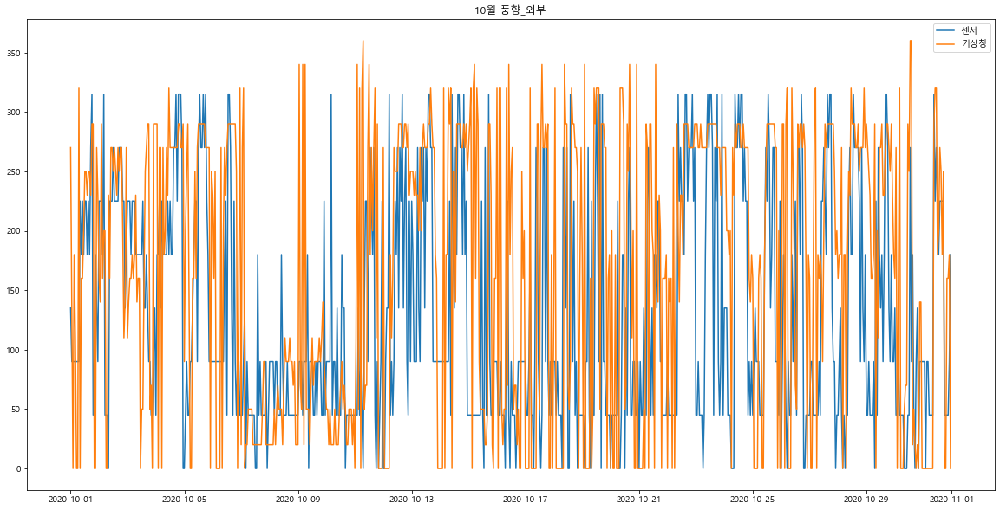

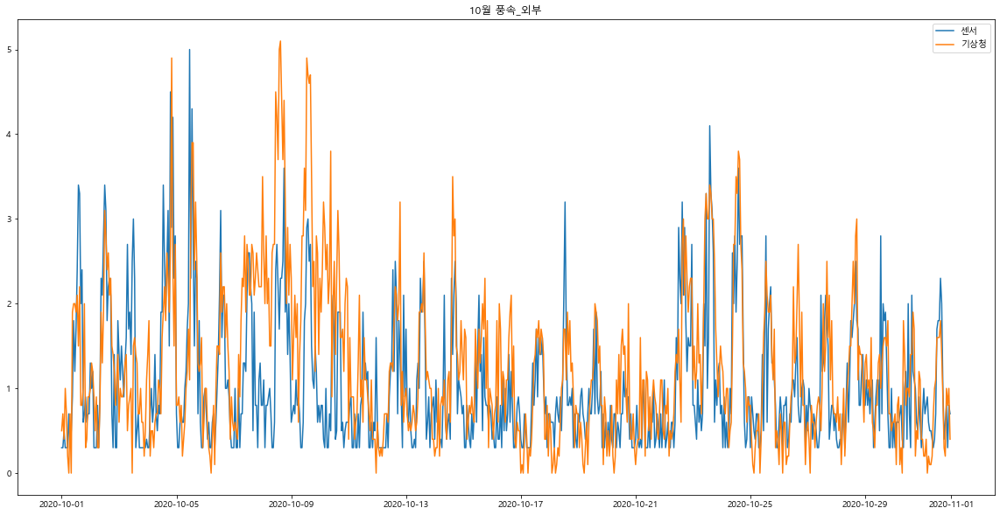

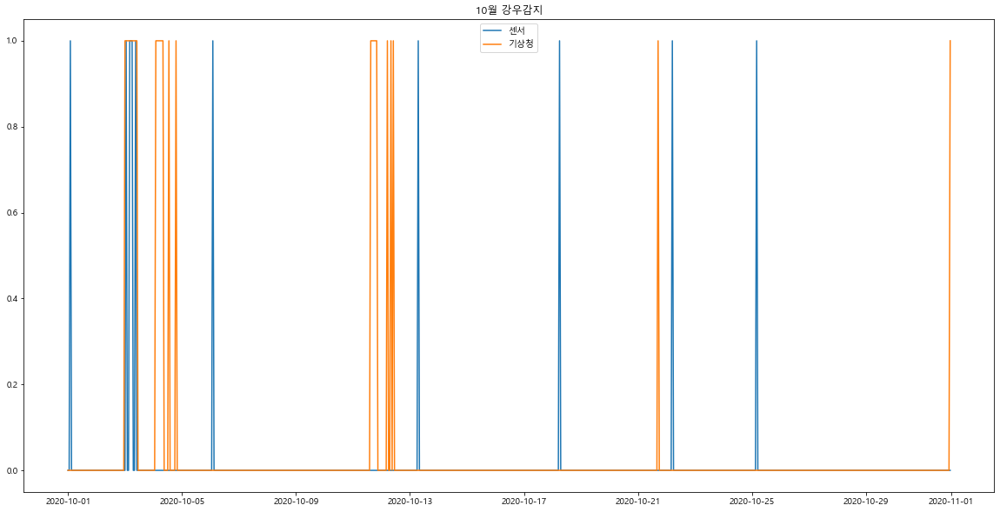

c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


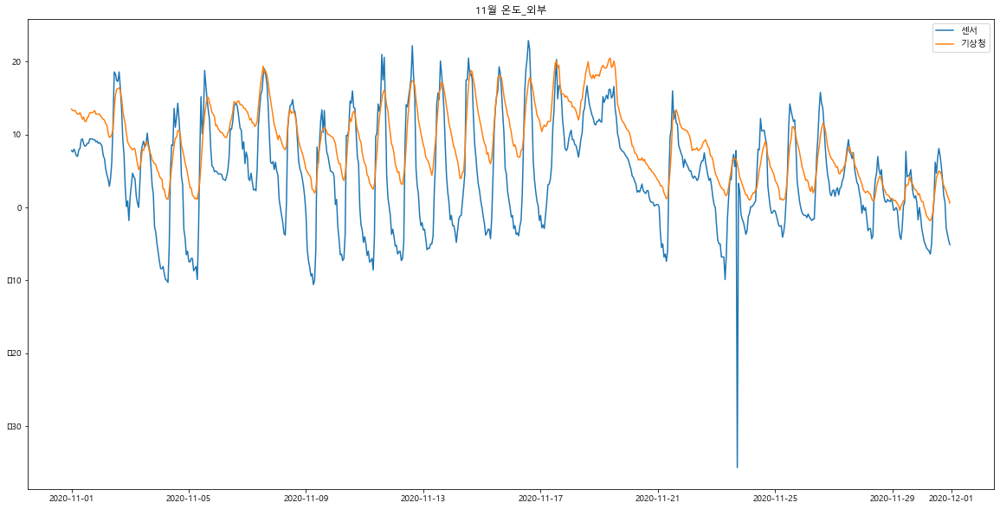

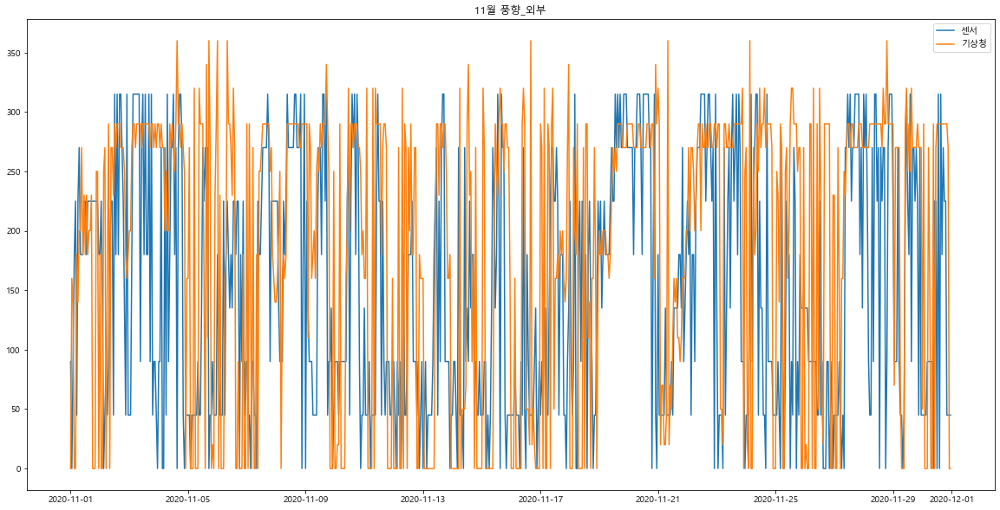

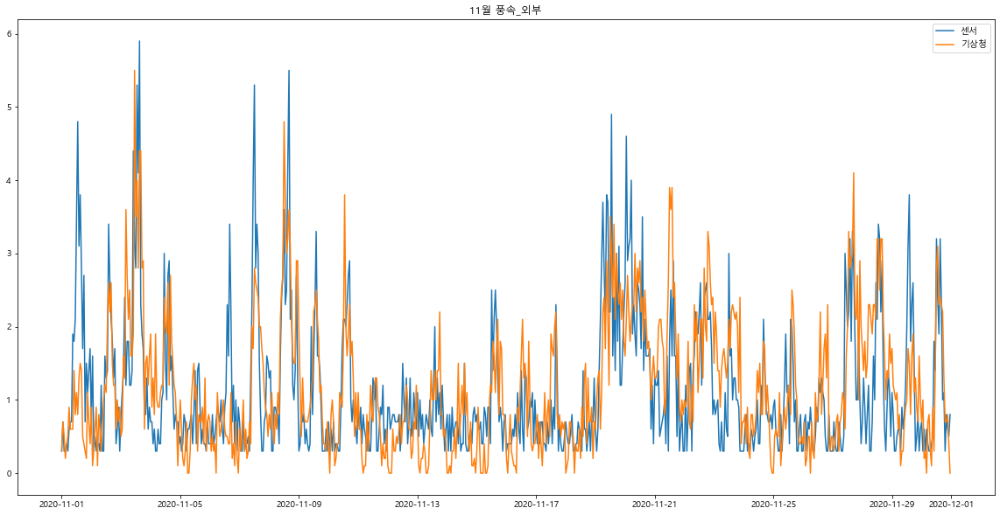

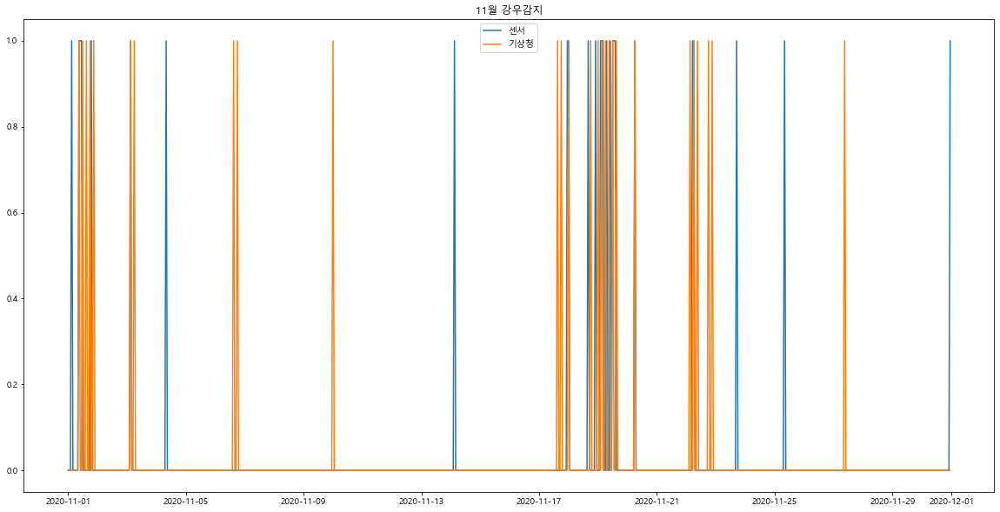

c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


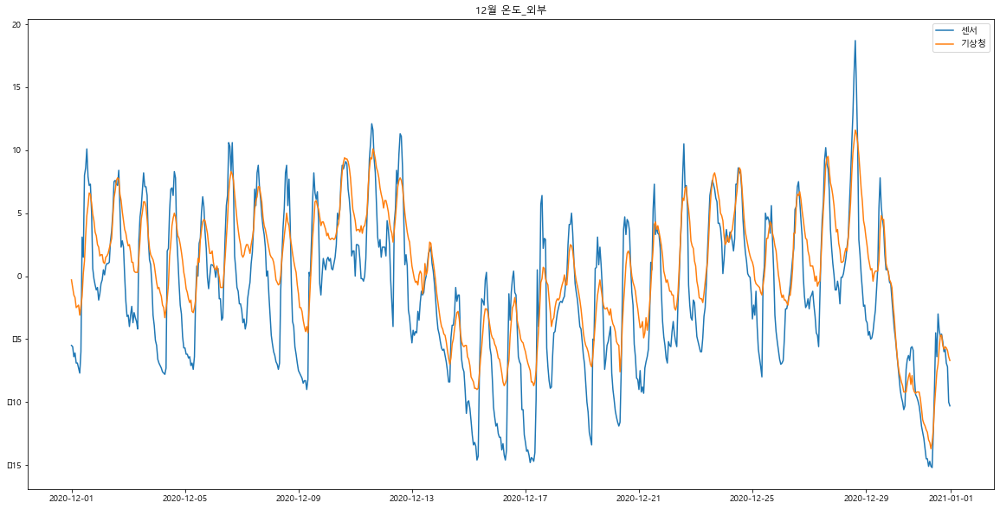

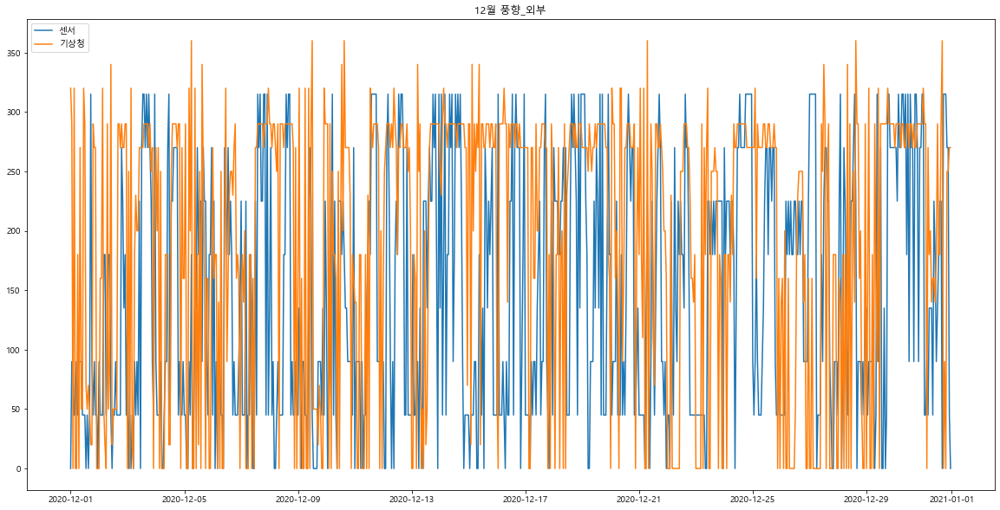

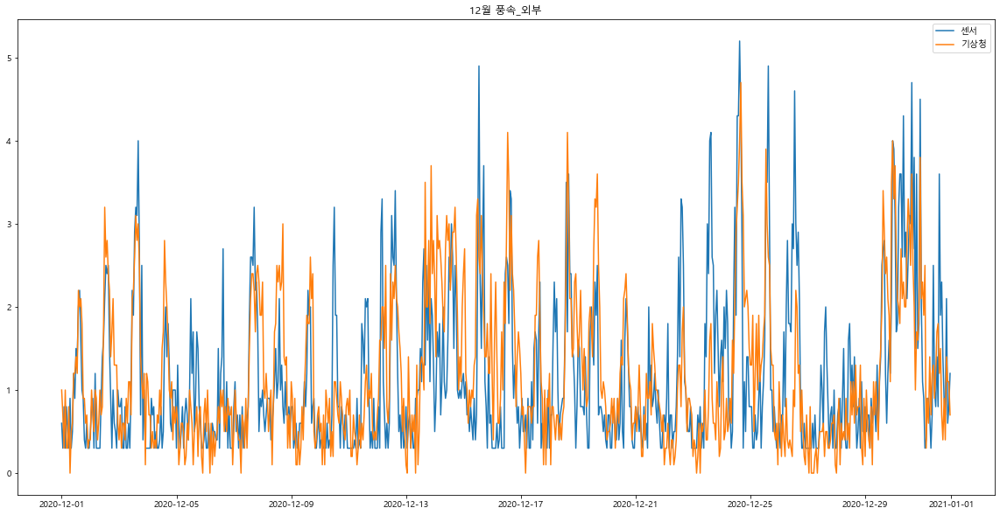

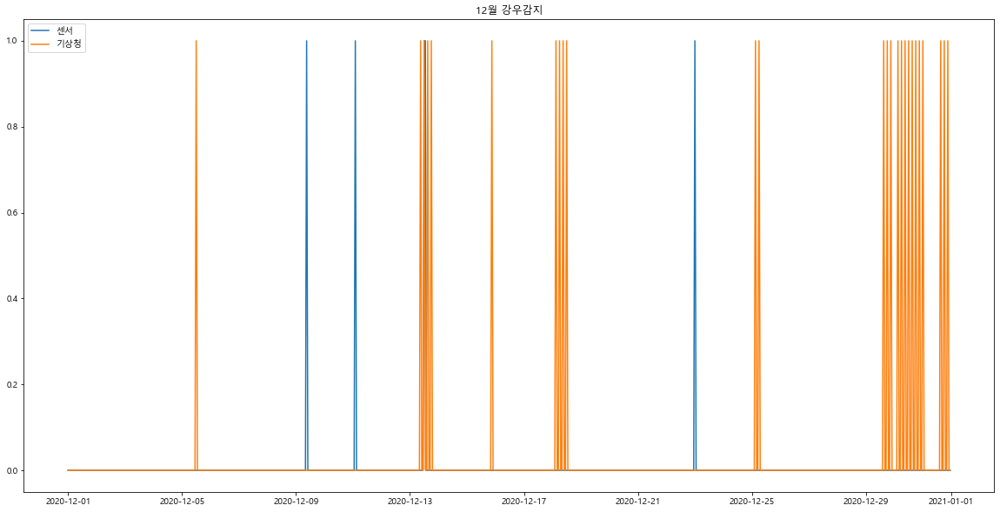

c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


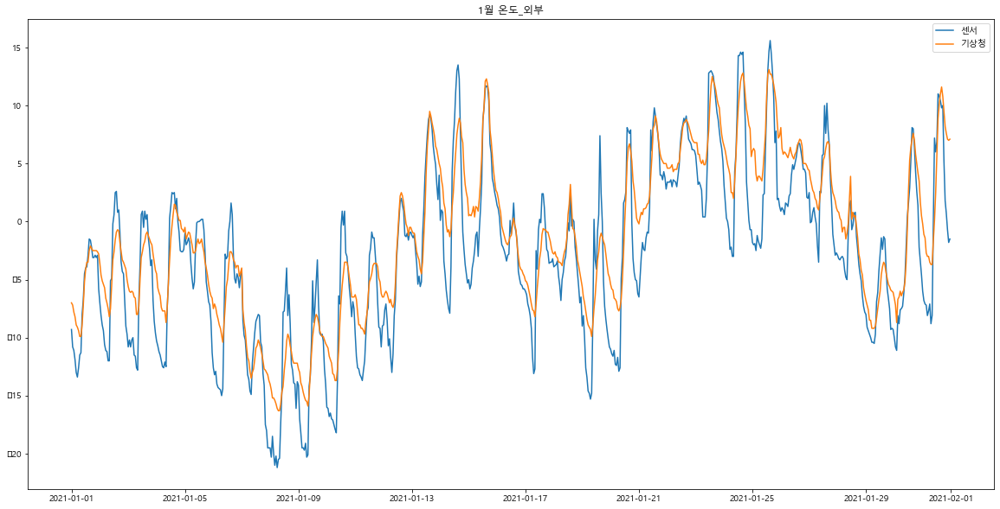

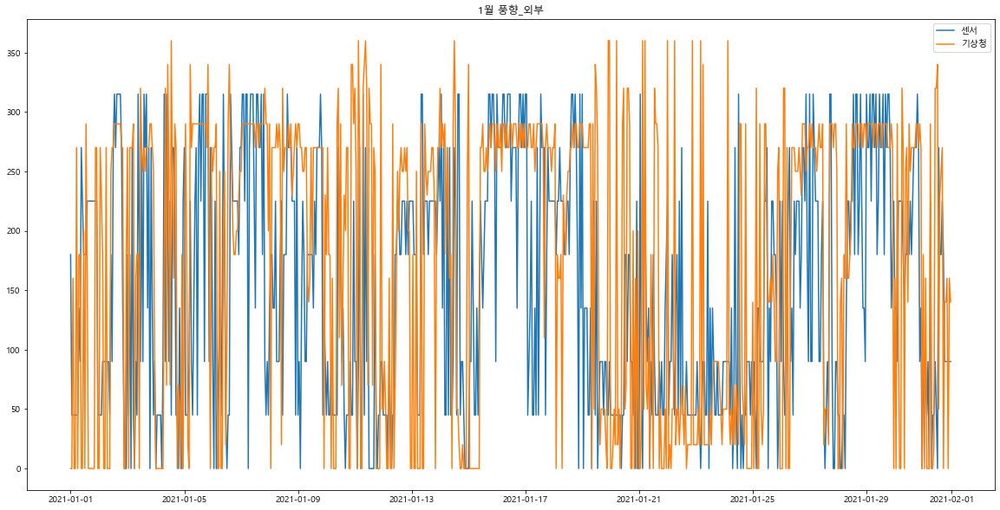

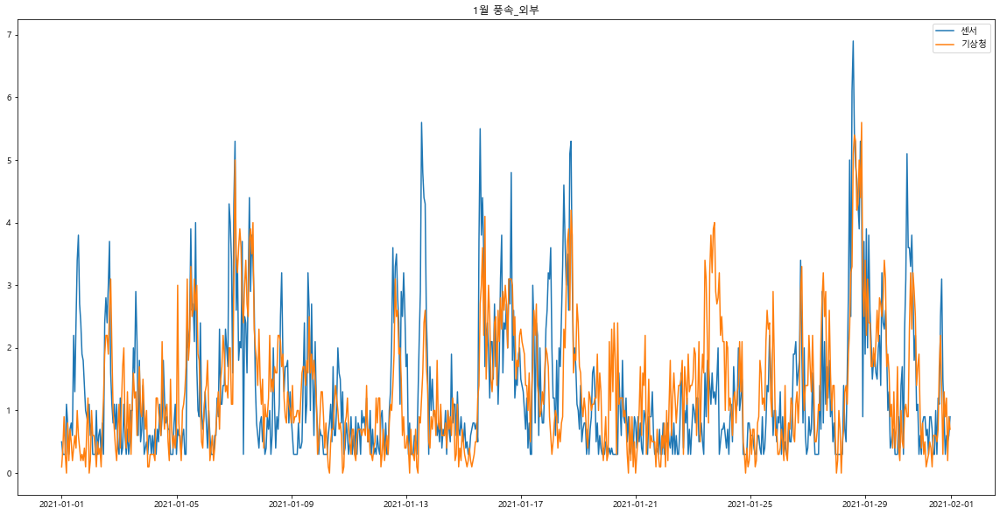

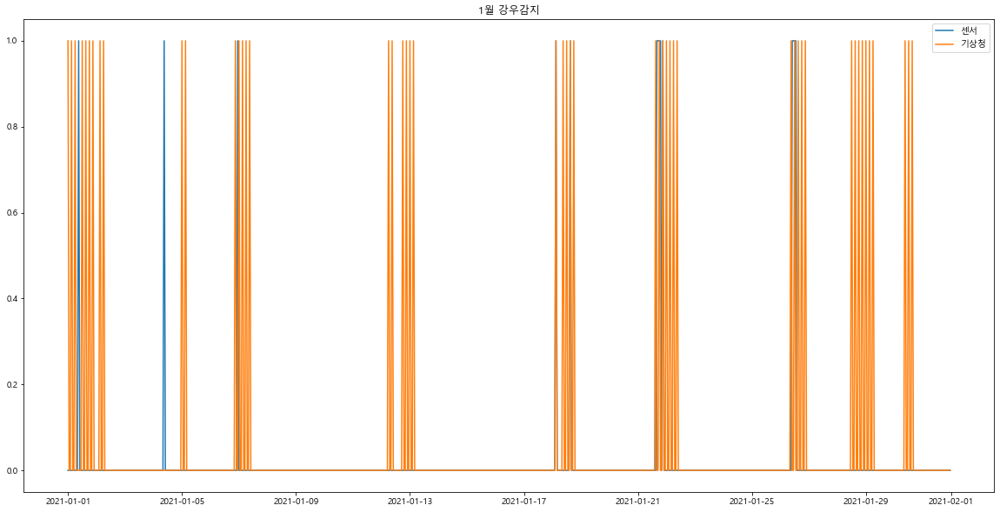

c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


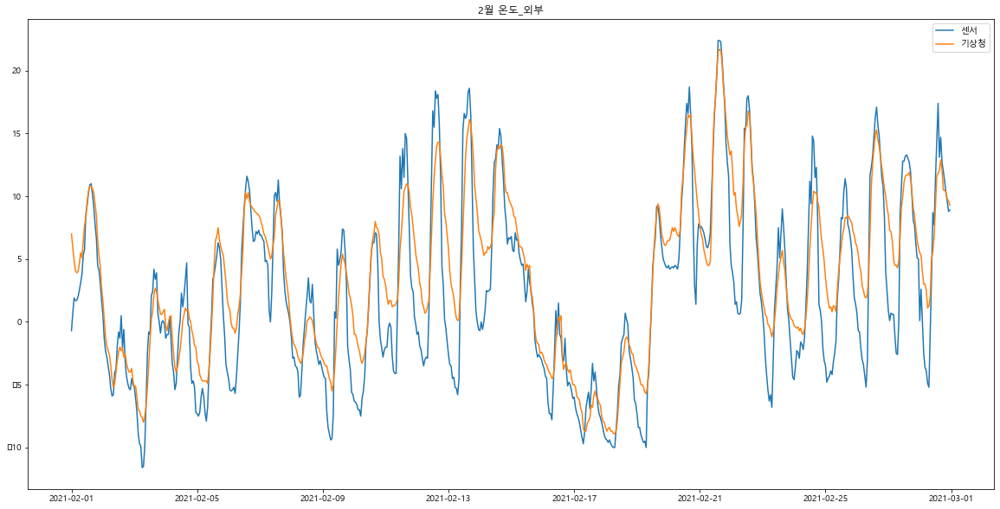

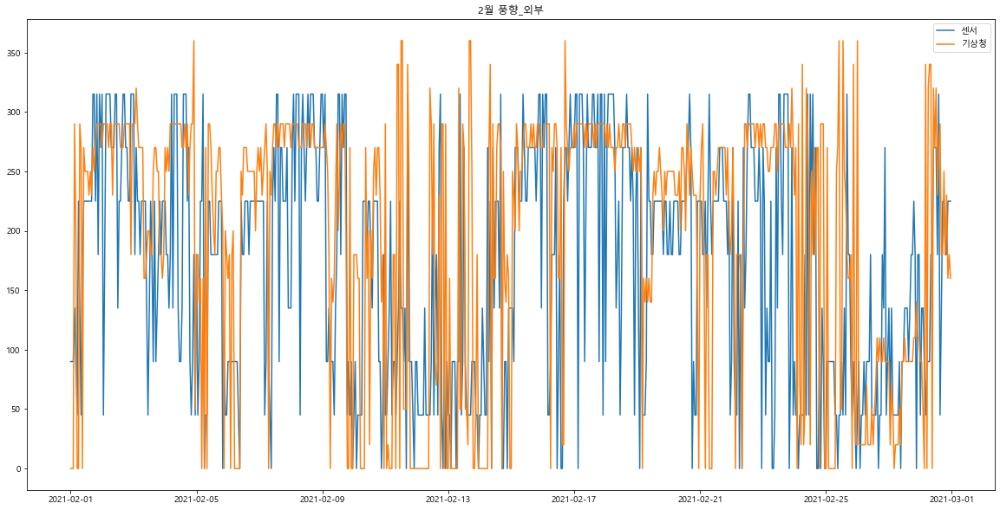

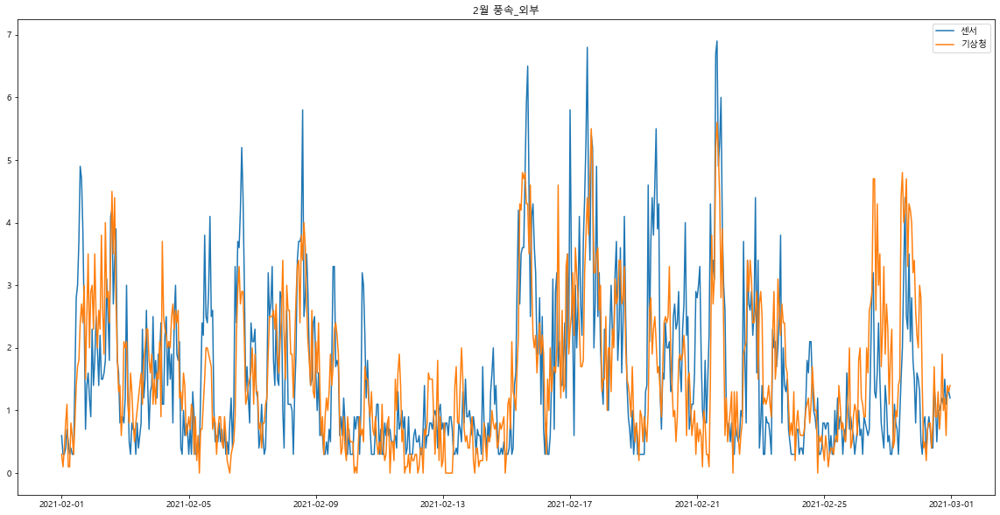

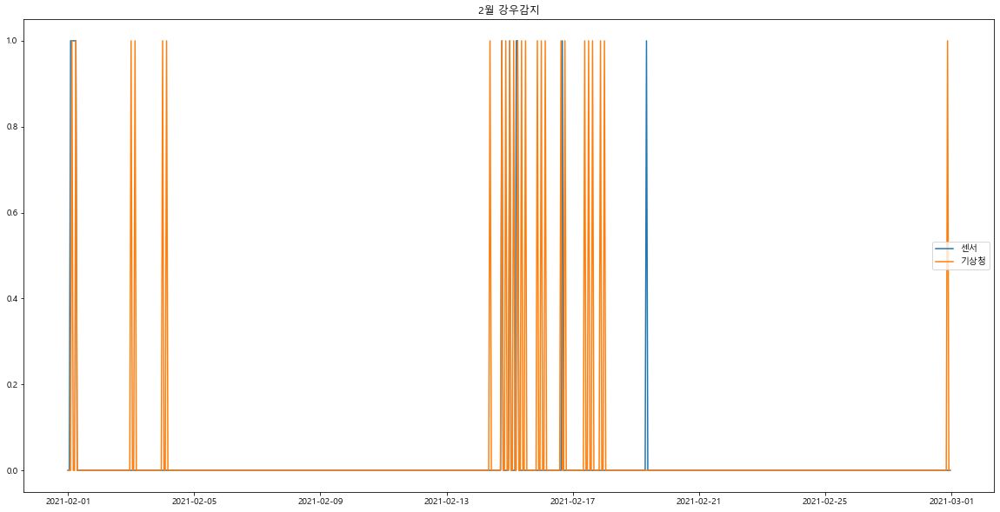

c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\Users\mool8\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


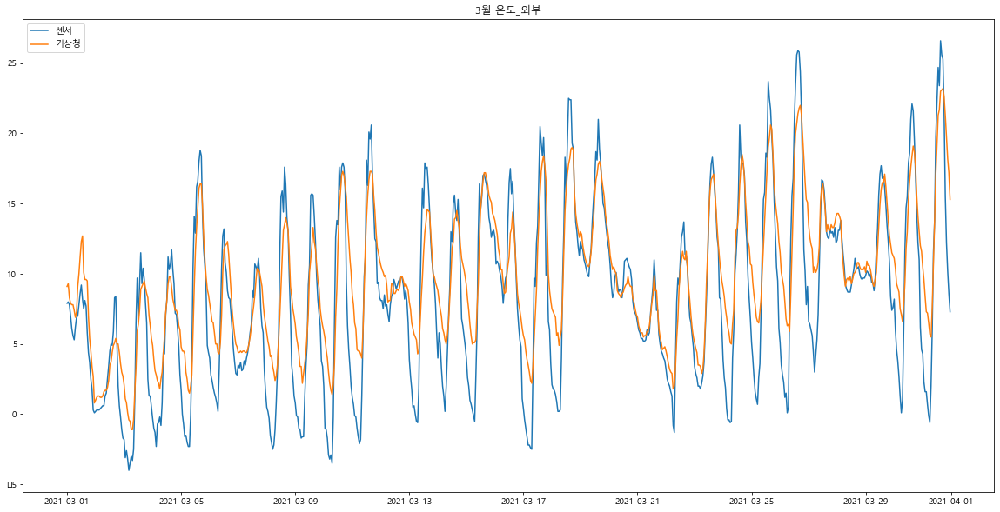

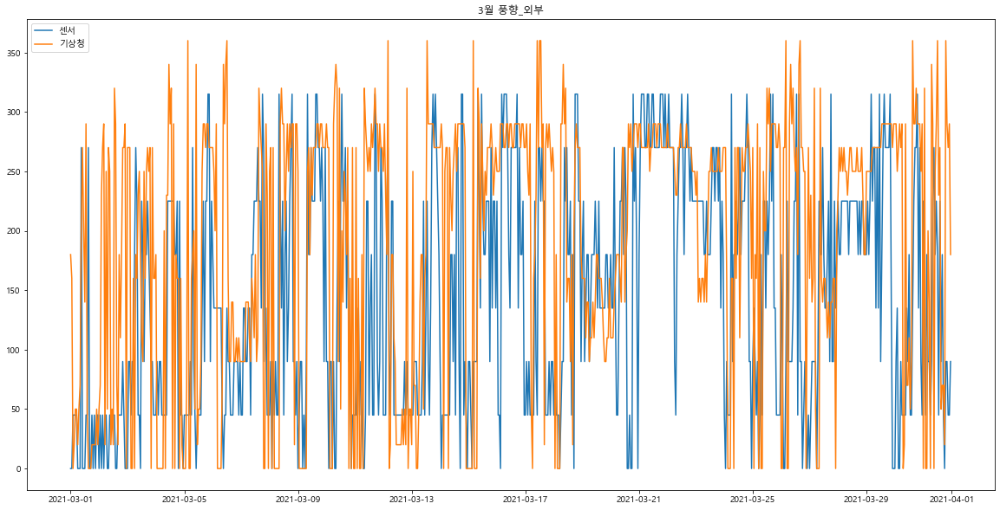

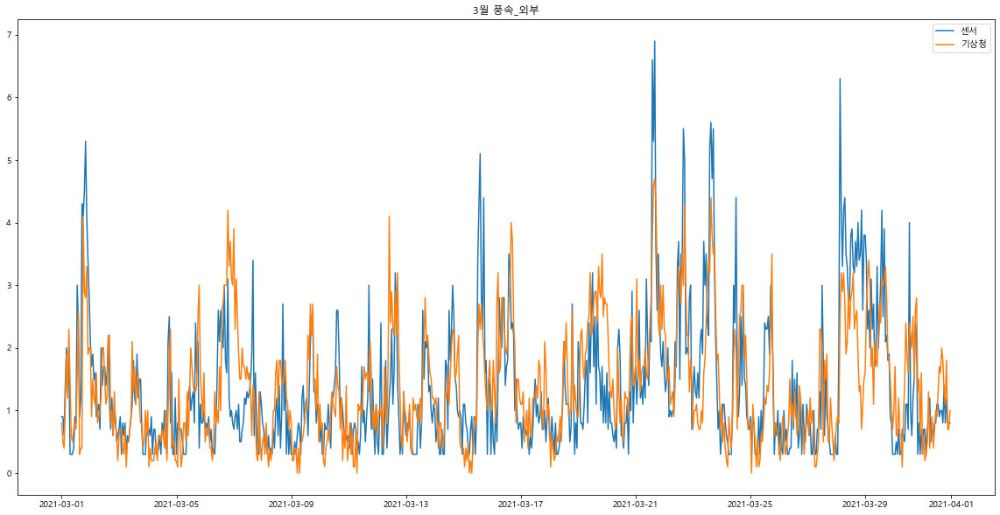

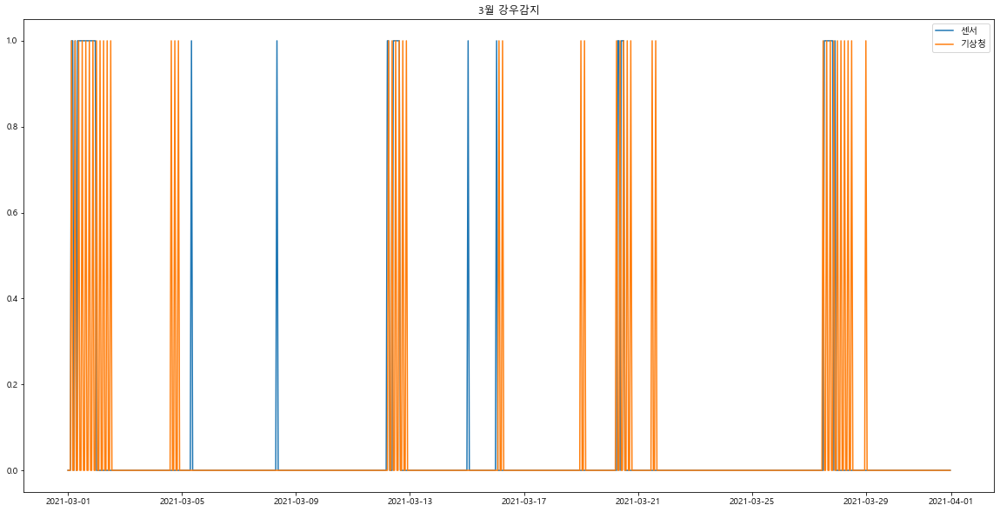

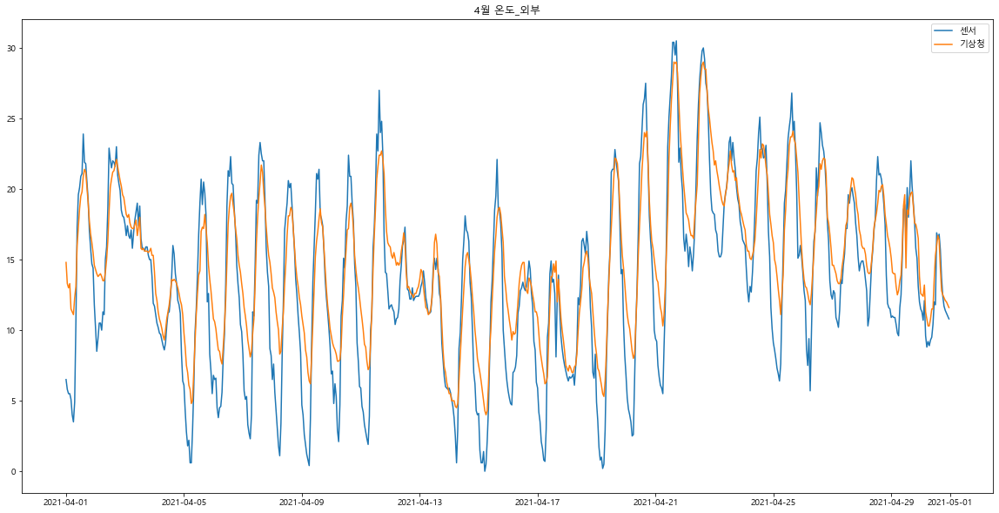

...

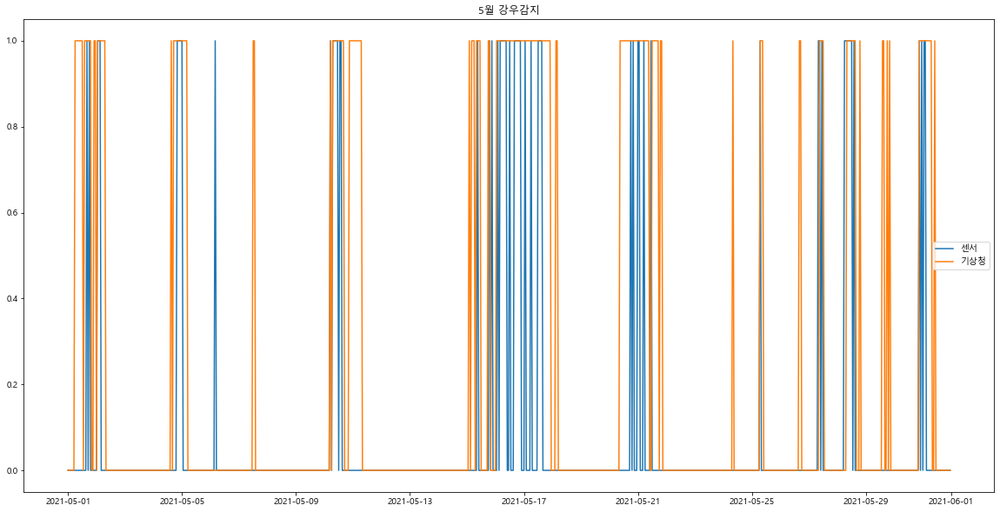

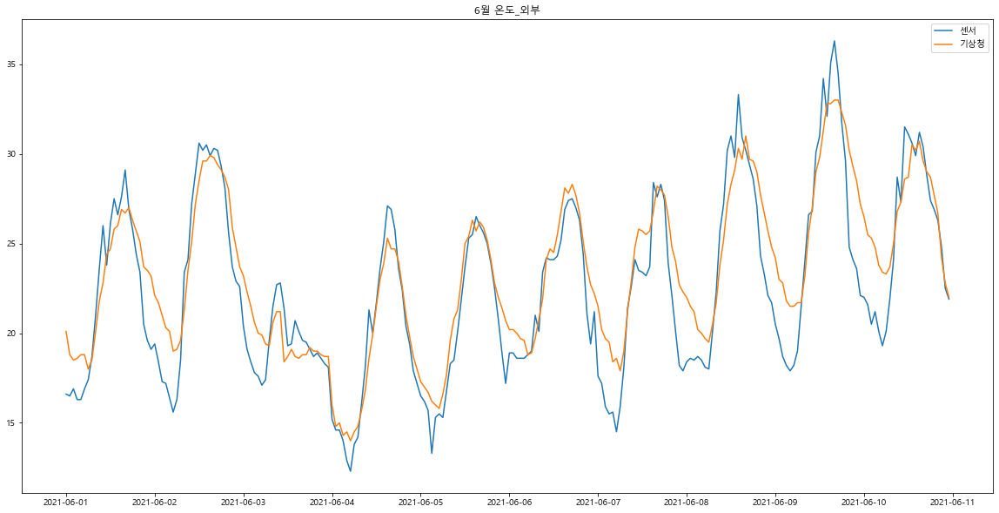

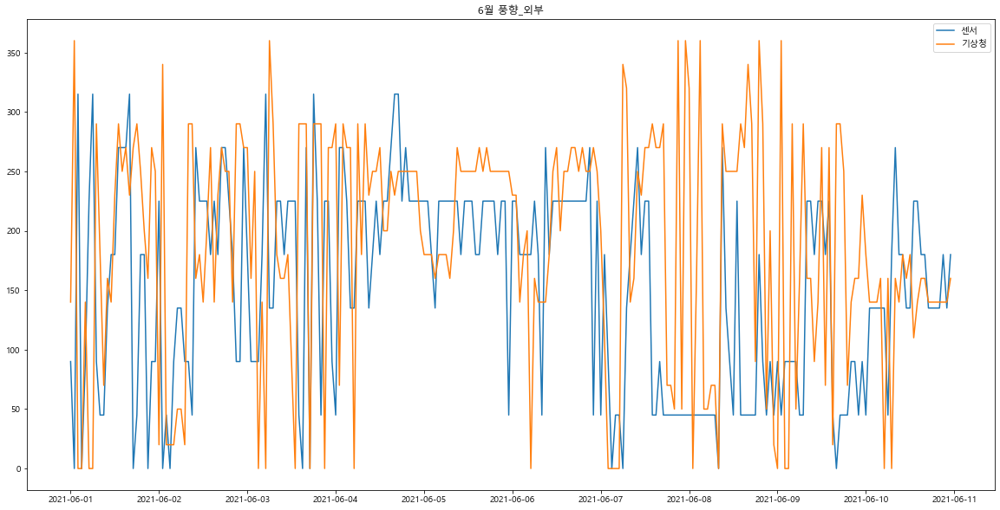

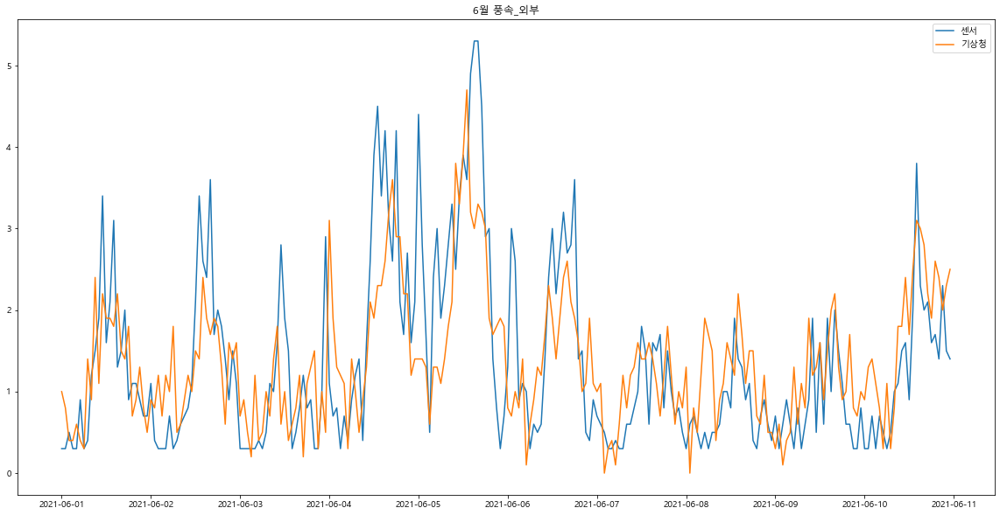

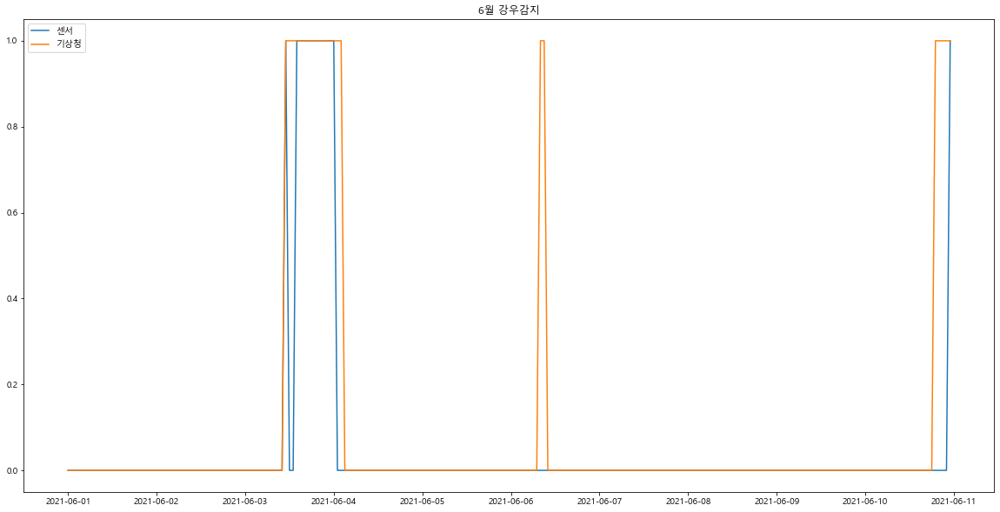

In [73]:
for m in date.dt.month.unique() :
    sub_df = df_5_weather.loc[df_5_weather["realTime"].dt.month == m]
    w_sub_df = weather_df.loc[weather_df["일시"].dt.month == m]

    x = sub_df["realTime"]
    
    for i in range(1, 5) :
        plt.figure(figsize=(20, 10))

        plt.plot(x, sub_df.iloc[:, i], label="센서")
        plt.plot(x, w_sub_df.iloc[:, i], label="기상청")
        plt.legend()
        
        title = f"{m}월 {df_5_weather.columns[i]}"
        plt.title(title)
        plt.savefig(f"2020/1.환경/plot/스마트팜 센서, 기상청 비교_{title}.png")
        plt.show()
        plt.close()